# Preparations

In this computer exercise we will work with visualisations of time series data. We will also explore how to find and plot trends in data.

For this, we will use some datasets and functions from the forecast, plotly, nlme and fpp2 packages. We start by loading the required packages:

In [1]:
library(ggplot2)
library(forecast)
library(plotly)
library(nlme) 
library(fpp2)

Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang
Registered S3 method overwritten by 'xts':
  method     from
  as.zoo.xts zoo 
Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 
Registered S3 methods overwritten by 'forecast':
  method             from    
  fitted.fracdiff    fracdiff
  residuals.fracdiff fracdiff

Attaching package: ‘plotly’

The following object is masked from ‘package:ggplot2’:

    last_plot

The following object is masked from ‘package:stats’:

    filter

The following object is masked from ‘package:graphics’:

    layout


Attaching package: ‘nlme’

The following object is masked from ‘package:forecast’:

    getResponse

Loading required package: fma
Warning message:
“package ‘fma’ was built under R version 3.6.2”Loading required package: expsmooth


In case you don’t already have them installed on your computer, you can install and load these packages using:

In [ ]:
install.packages(c("nlme", "plotly", "forecast", "fpp2"), dependencies = TRUE)
library(plotly)
library(forecast)
library(nlme)
library(fpp2)

In this exercise, we will study the following datasets:

• a10: total monthly anti-diabetic drug sales in Australia 1991-2008; from fpp2. • gold: daily gold prices in the 1980’s; from fpp2.

• elecdaily: daily electricity demand in Victoria, Australia in 2014; from fpp2. • msleep: describing the sleep times of 83 mammals; from ggplot2.

• Oxboys: the height of a number of boys from Oxford, England, over time; from nlme. • writing: sales of printing paper in France, 1963-1972; from fpp2.

## Trends in scatterplots

Before we have a look at time series data, let’s return to an example that we studied in the last computer exercise: the relationship between animal brain size and sleep times:

Warning message:
“Removed 27 rows containing missing values (geom_point).”

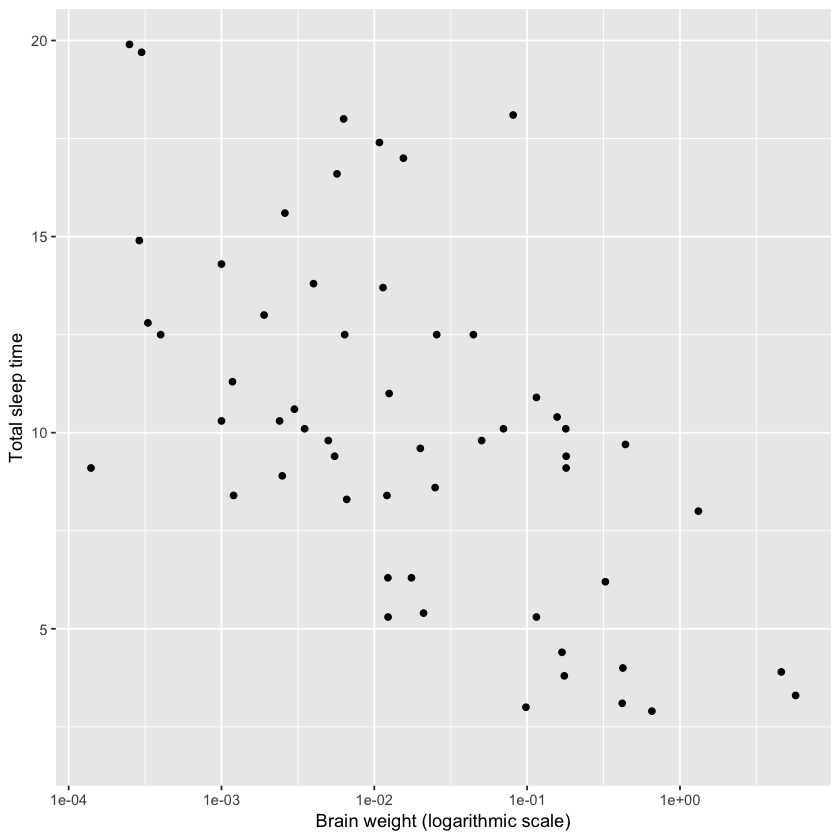

In [2]:
ggplot(msleep, aes(brainwt, sleep_total)) + 
geom_point() +
xlab("Brain weight (logarithmic scale)") + 
ylab("Total sleep time") +
scale_x_log10()

There appears to be a decreasing trend in the plot. To aid the eye, we can add a smoothed line by adding a new geom, geom_smooth, to the figure:

`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 27 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 27 rows containing missing values (geom_point).”

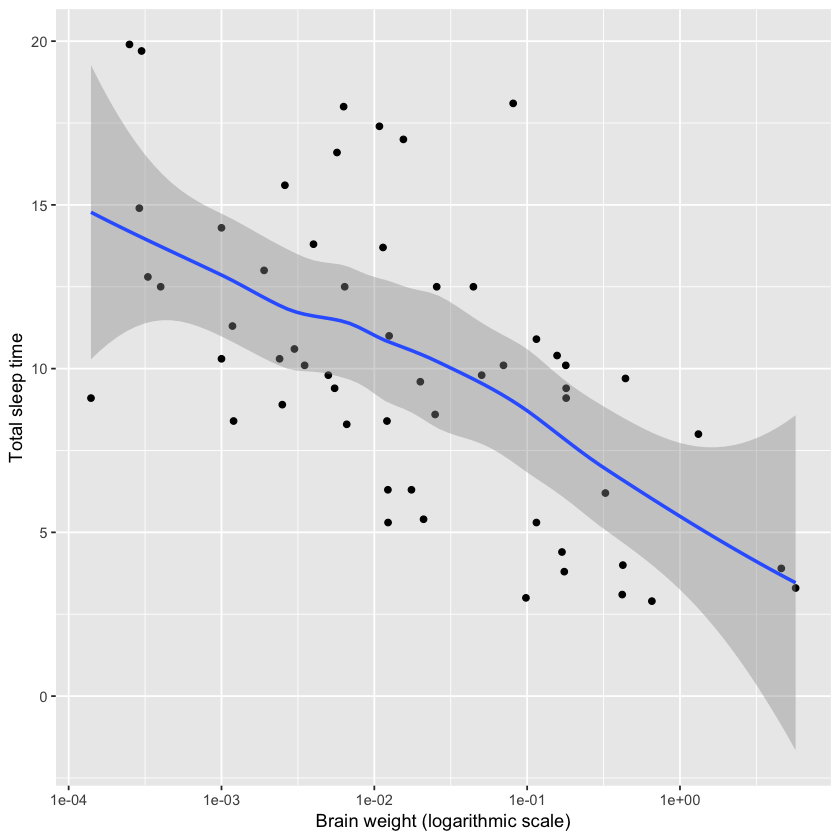

In [3]:
ggplot(msleep, aes(brainwt, sleep_total)) + 
geom_point() +
geom_smooth() +
xlab("Brain weight (logarithmic scale)") + 
ylab("Total sleep time") +
scale_x_log10()

This technique is useful for bivariate data as well as for time series.

By default, geom_smooth adds a line fitted using either LOESS1 or GAM2, as well as the corresponding 95 % confidence interval. There are several useful arguments that can be used with geom_smooth. You will explore some of these in exercise below.

## Exercise 1

Check the documentation for geom_smooth. Starting with the plot of brain weight vs. sleep time created above, do the following:

Decrease the degree of smoothing for the LOESS line that was fitted to the data. Which is better in this case, more or less smoothing?

A) To decrease the smoothness of the line, we use the span argument in geom_smooth. The default is geom_smooth(span = 0.75). Decreasing this values yields a very different fit:

`geom_smooth()` using method = 'loess' and formula 'y ~ x'
Warning message:
“Removed 27 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 27 rows containing missing values (geom_point).”

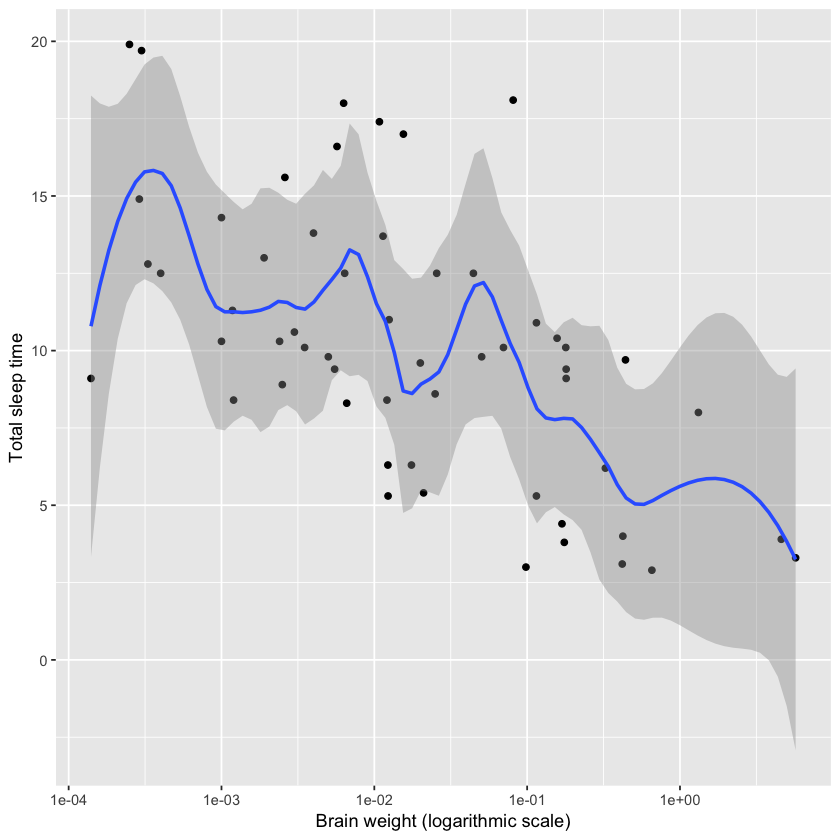

In [4]:
ggplot(msleep, aes(brainwt, sleep_total)) + 
geom_point() +
geom_smooth(span = 0.25) +
xlab("Brain weight (logarithmic scale)") + 
ylab("Total sleep time") +
scale_x_log10()

More smoothing is probably preferable in this case. The relationship appears to be fairly weak, and appears to be roughly linear.

Fit a straight line to the data instead of a non-linear LOESS line.

We can use the method argument in geom_smooth to fit a straight line using lm instead of LOESS:

Warning message:
“Removed 27 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 27 rows containing missing values (geom_point).”

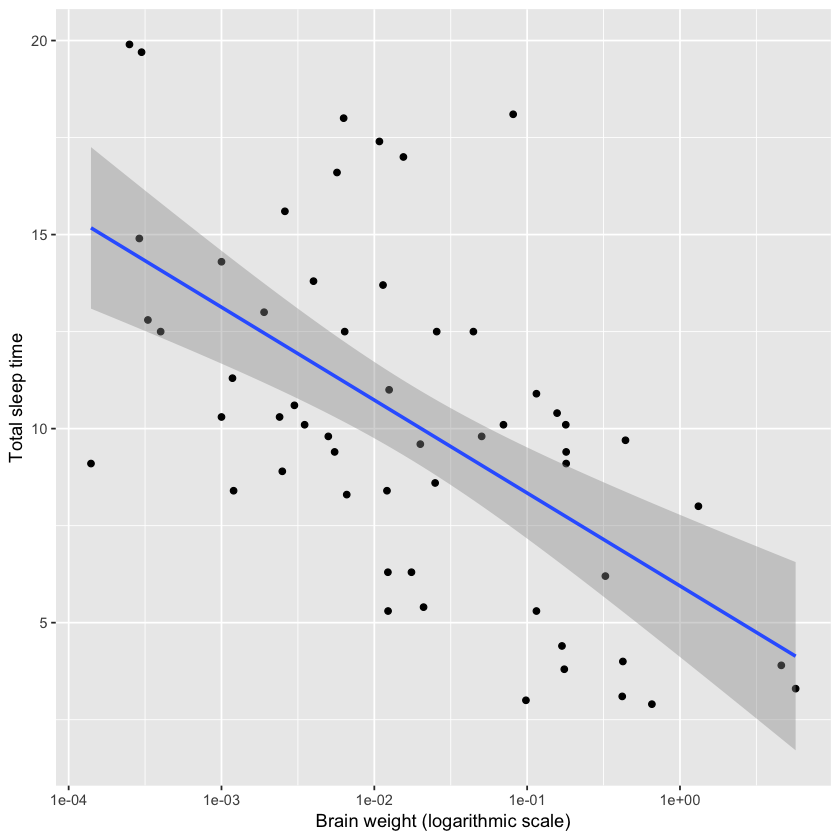

In [5]:
ggplot(msleep, aes(brainwt, sleep_total)) + geom_point() +
geom_smooth(method = "lm") +
xlab("Brain weight (logarithmic scale)") + ylab("Total sleep time") +
scale_x_log10()

Remove the confidence interval from the plot.

To remove the confidence interval from the plot, we set se = FALSE in geom_smooth:

Warning message:
“Removed 27 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 27 rows containing missing values (geom_point).”

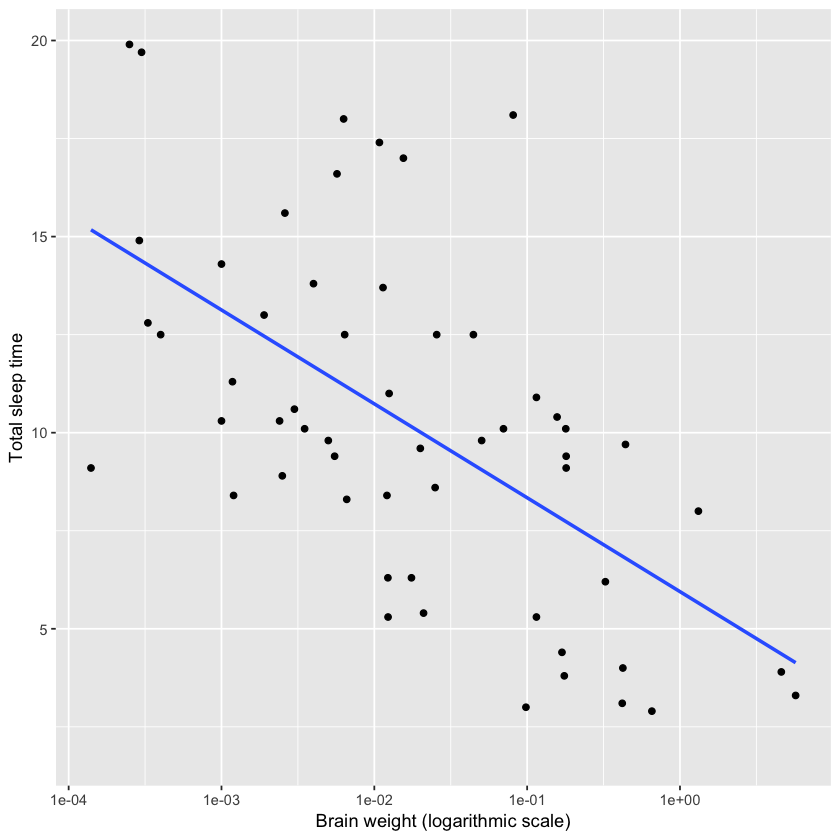

In [6]:
ggplot(msleep, aes(brainwt, sleep_total)) + 
geom_point() +
geom_smooth(method = "lm", se = FALSE) + 
xlab("Brain weight (logarithmic scale)") + 
ylab("Total sleep time") +
scale_x_log10()

Change the colour of the fitted line to red.

Warning message:
“Removed 27 rows containing non-finite values (stat_smooth).”Warning message:
“Removed 27 rows containing missing values (geom_point).”

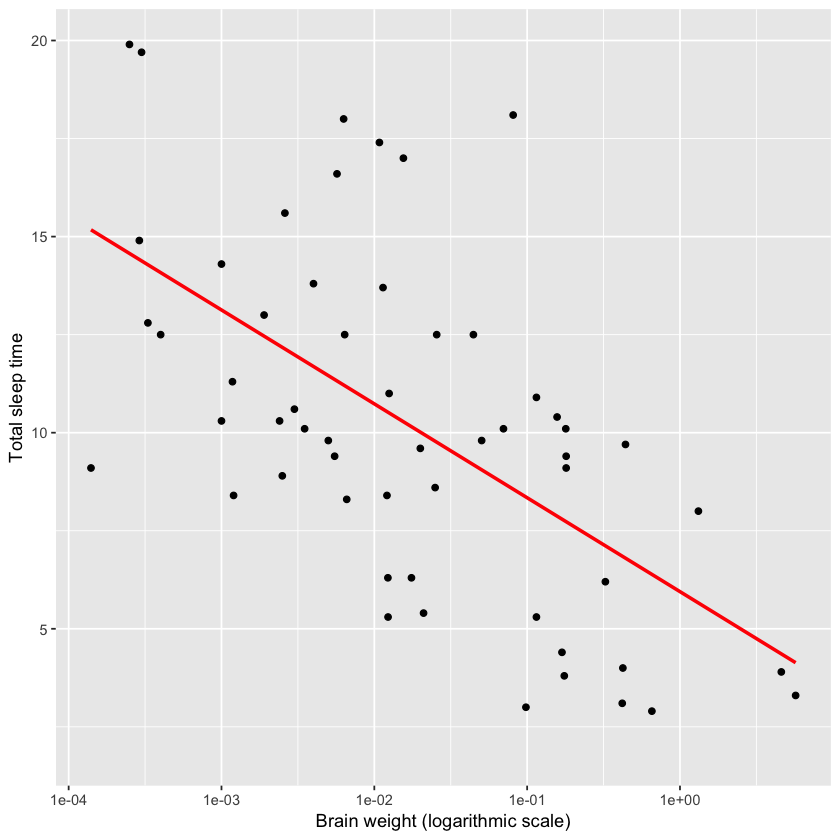

In [7]:
ggplot(msleep, aes(brainwt, sleep_total)) + 
geom_point() +
geom_smooth(method = "lm", se = FALSE, colour = "red") + 
xlab("Brain weight (logarithmic scale)") +
ylab("Total sleep time") +
scale_x_log10()

## Time series plots 

The a10 dataset contains information about the monthly anti-diabetic drug sales in Australia during the period July 1991 to June 2008. By checking its structure, we see that it is saved as a time series object:

In [8]:
library(fpp2)
str(a10)

 Time-Series [1:204] from 1992 to 2008: 3.53 3.18 3.25 3.61 3.57 ...


ggplot2 requires that data is saved as a data frame or tibble in order for it to be plotted. In order to plot the time series, we could first convert it to a data frame and then plot each point using geom_points:

In [9]:
a10_df <- data.frame(time = time(a10), sales = a10)

Don't know how to automatically pick scale for object of type ts. Defaulting to continuous.
Don't know how to automatically pick scale for object of type ts. Defaulting to continuous.


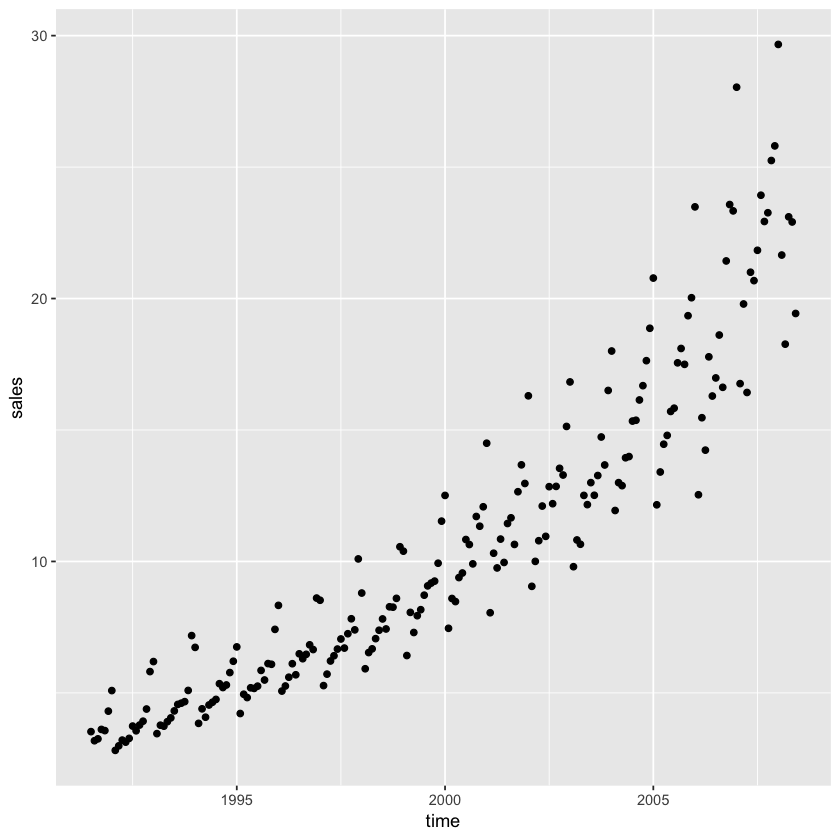

In [10]:
ggplot(a10_df, aes(time, sales)) +
geom_point()

It is however usually preferable to plot time series using lines instead of points. This is done using a different geom: geom_line:

Don't know how to automatically pick scale for object of type ts. Defaulting to continuous.
Don't know how to automatically pick scale for object of type ts. Defaulting to continuous.


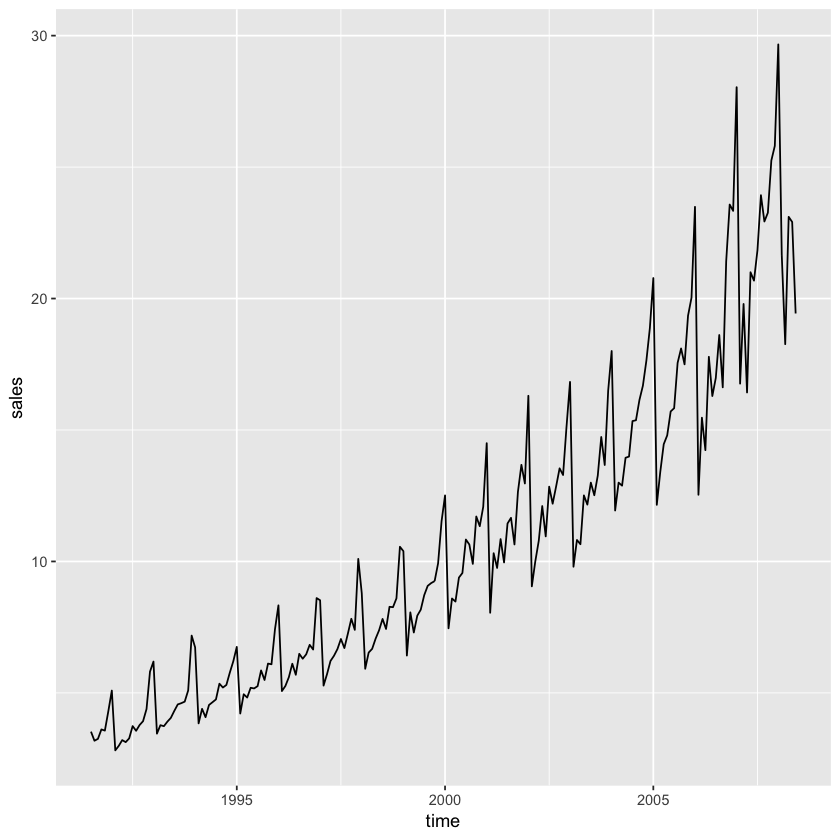

In [11]:
ggplot(a10_df, aes(time, sales)) + 
geom_line()

Having to convert the time series object to a data frame is a little awkward. Luckily, there is a way around this. ggplot2 offers a function called autoplot, that automatically draws an appropriate plot for certain types of data. The forecast package extends this to include time series objects:

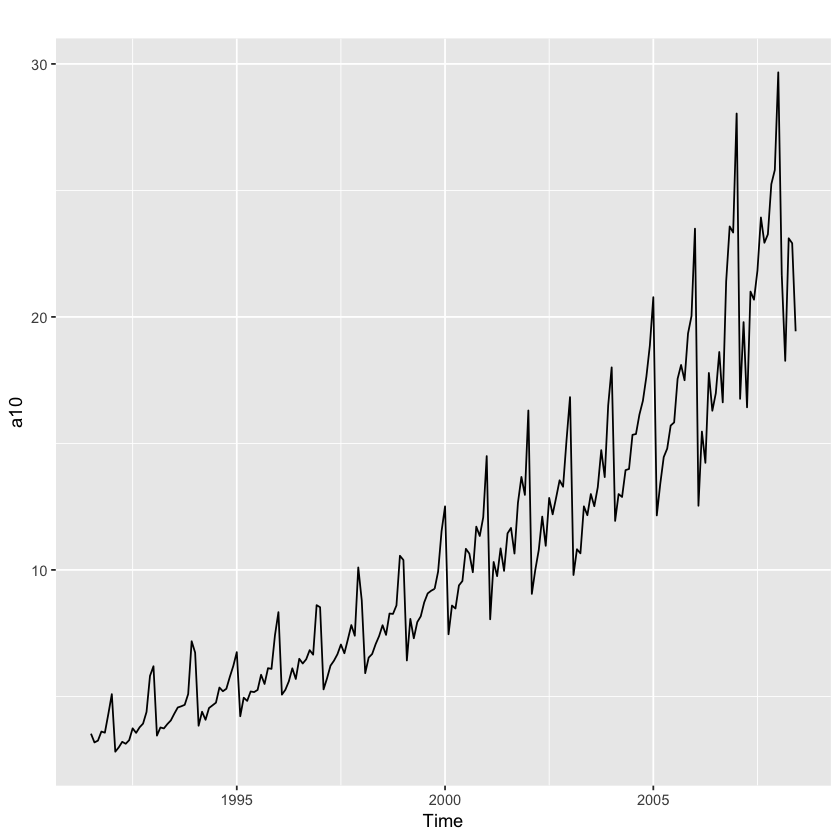

In [12]:
library(forecast)
autoplot(a10)

We can still add other geoms, axis labels and other things just as before. autoplot has simply replaced the ggplot(data, aes()) + geom part that would be the first two rows of the ggplot2 figure.

## Exercise 2 

Using the autoplot(a10) figure, do the following:

Add a smoothed line describing the trend in the data. Make sure that it is smooth enough not to capture the seasonality in the data.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


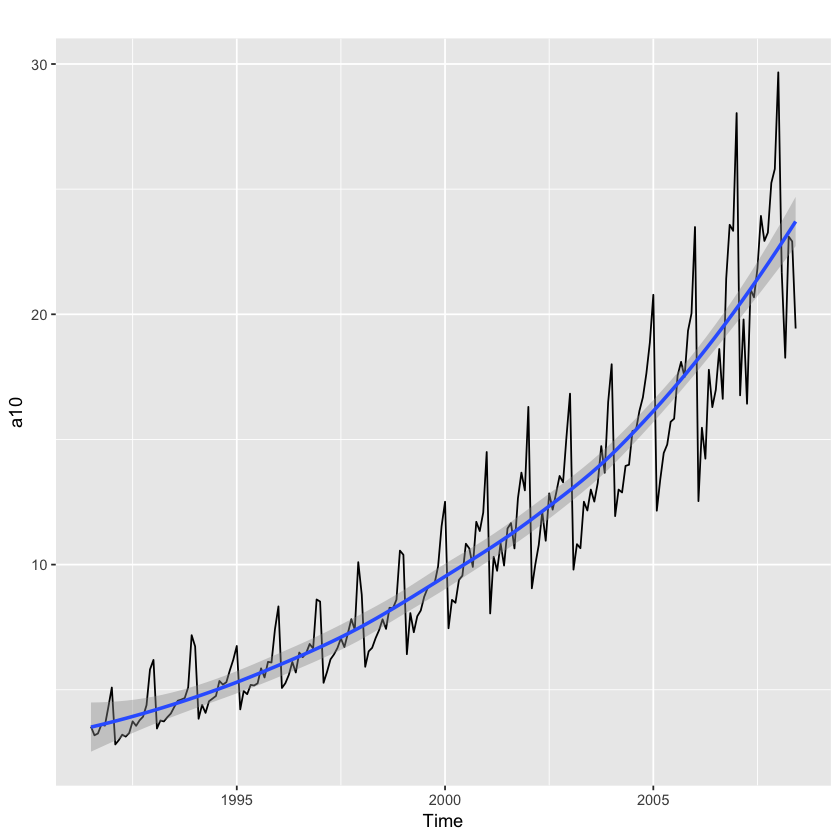

In [13]:
autoplot(a10)+
geom_smooth()

Change the label of the x-axis to “Year” and the label of the y-axis to “Sales ($ million)”.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


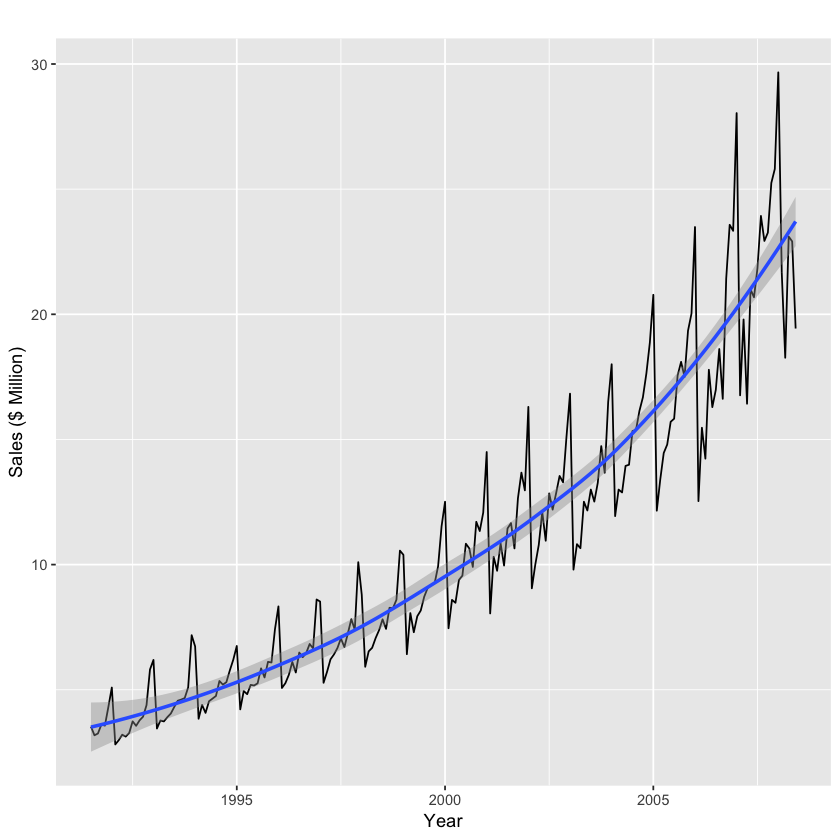

In [14]:
autoplot(a10) +
geom_smooth() +
xlab("Year") + 
ylab("Sales ($ Million)")

Check the documentation for the ggtitle function. What does it do? Use it with the figure.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


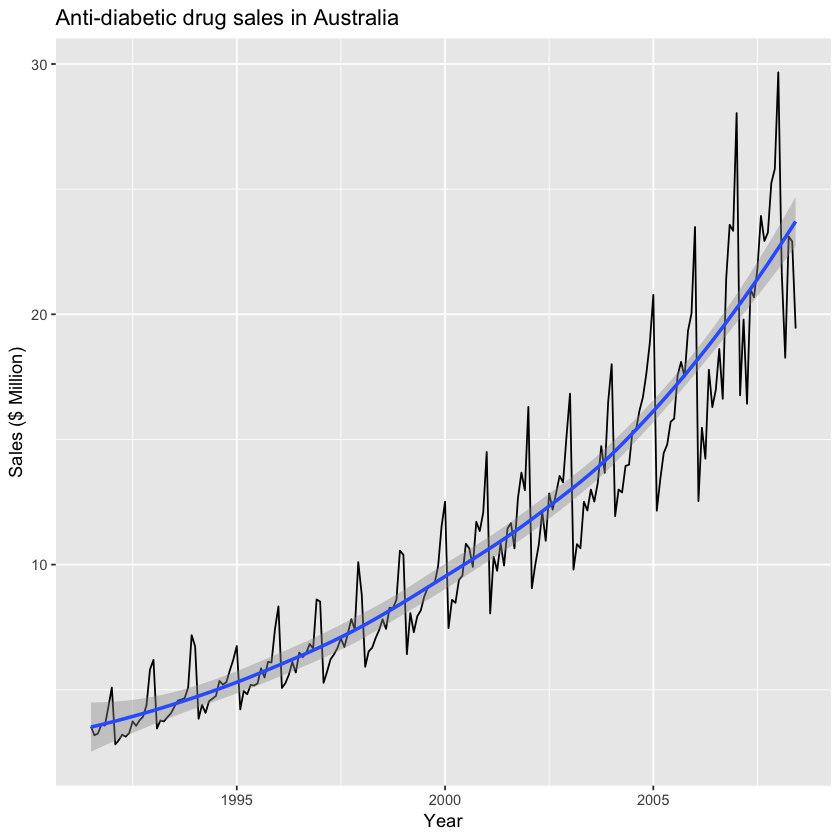

In [15]:
autoplot(a10) +
geom_smooth() +
xlab("Year") + 
ylab("Sales ($ Million)") +
ggtitle("Anti-diabetic drug sales in Australia")

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


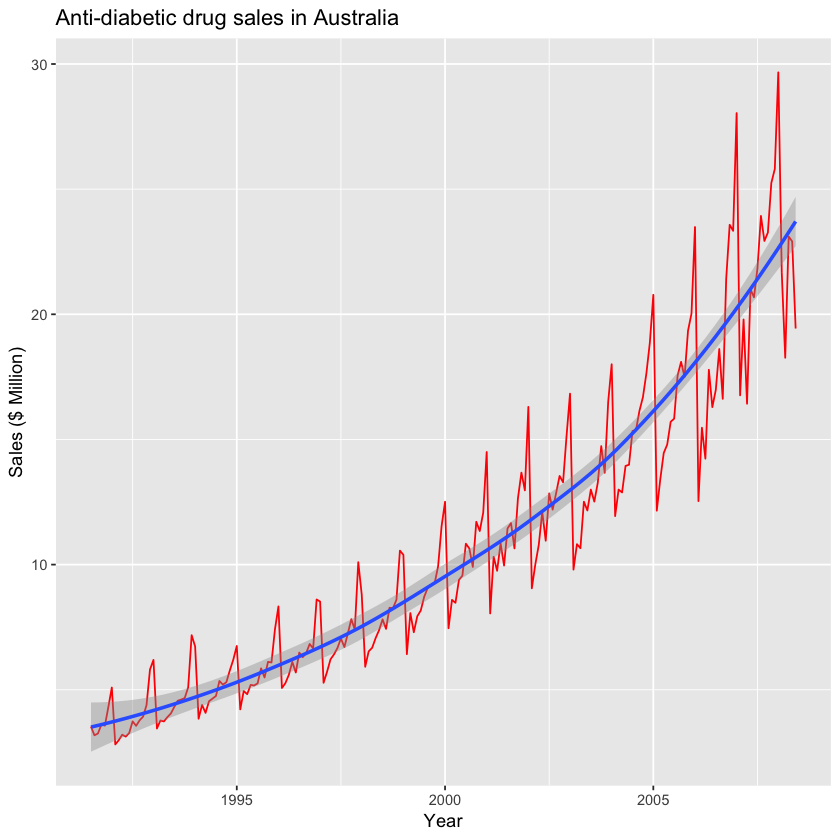

In [18]:
autoplot(a10, colour = "red") +
geom_smooth() +
xlab("Year") + 
ylab("Sales ($ Million)") +
labs(title = "Anti-diabetic drug sales in Australia")

Change the colour of the time series line to red.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


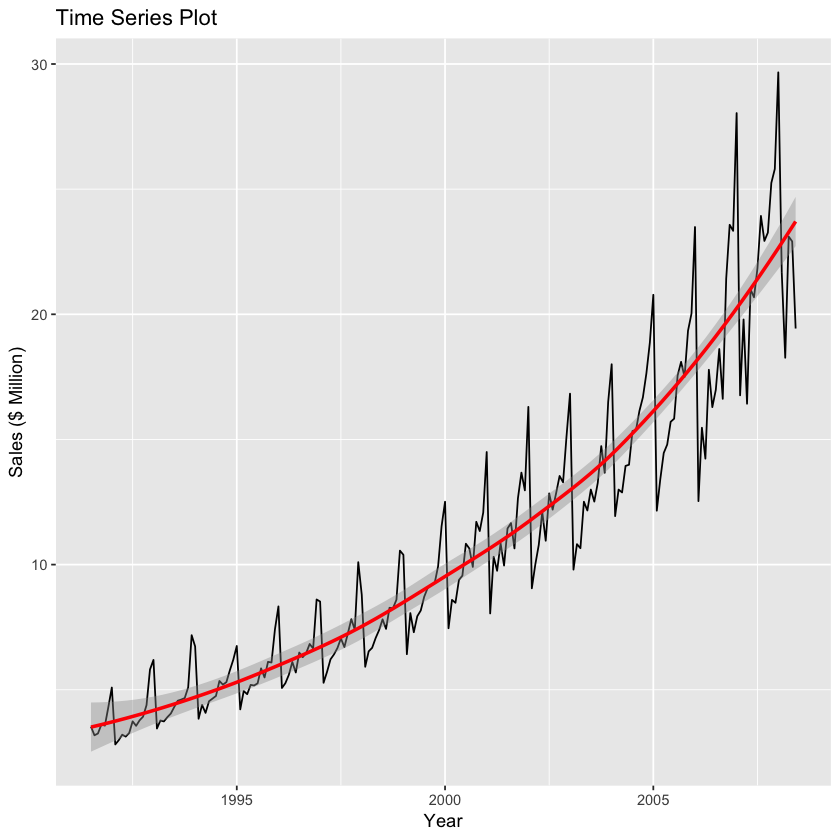

In [19]:
autoplot(a10) +
geom_smooth(colour = "red") +
xlab("Year") + 
ylab("Sales ($ Million)") +
labs(title = "Time Series Plot")

## Annotations and reference lines 

We sometimes wish to add text or symbols to plots, for instance to highlight interesting observations. Consider the following time series plot of daily morning gold prices:

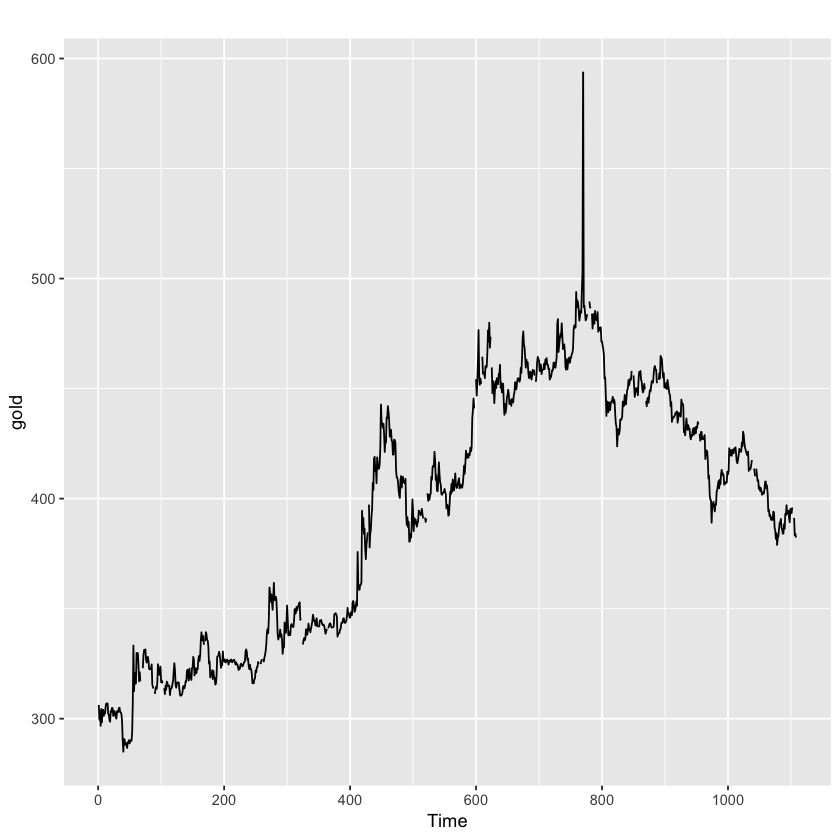

In [20]:
library(forecast); library(fpp2)
autoplot(gold)

There is a sharp spike a few weeks before day 800, which is due to an incorrect value in the data series. We’d like to add a note about that to the plot. First, we wish to find out on which day the spike appears. This can be done by checking the data manually, or using some code:

In [21]:
spike_date <- which.max(gold)

To add a circle around that point, we add a call to annotate to the plot:

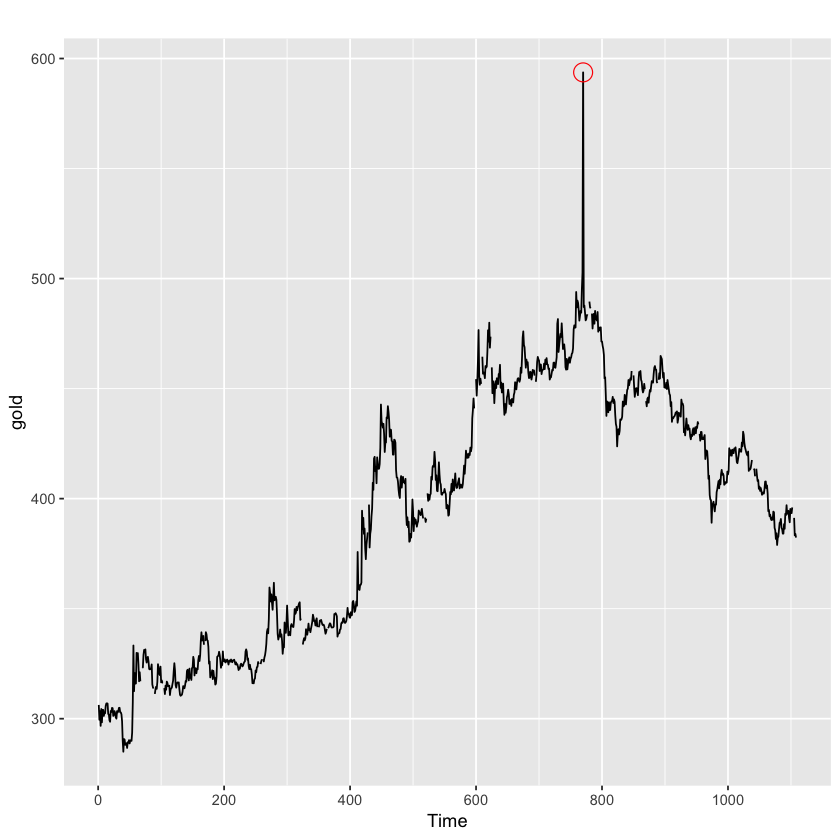

In [22]:
autoplot(gold) +
annotate(geom = "point", x = spike_date, y = gold[spike_date],
               size = 5, shape = 21, colour = "red", fill = "transparent")

## Exercise 3 

Using the figure created above and the documentation for annotate, do the following:

Add the text “Incorrect value” next to the circle.

In [23]:
?annotate

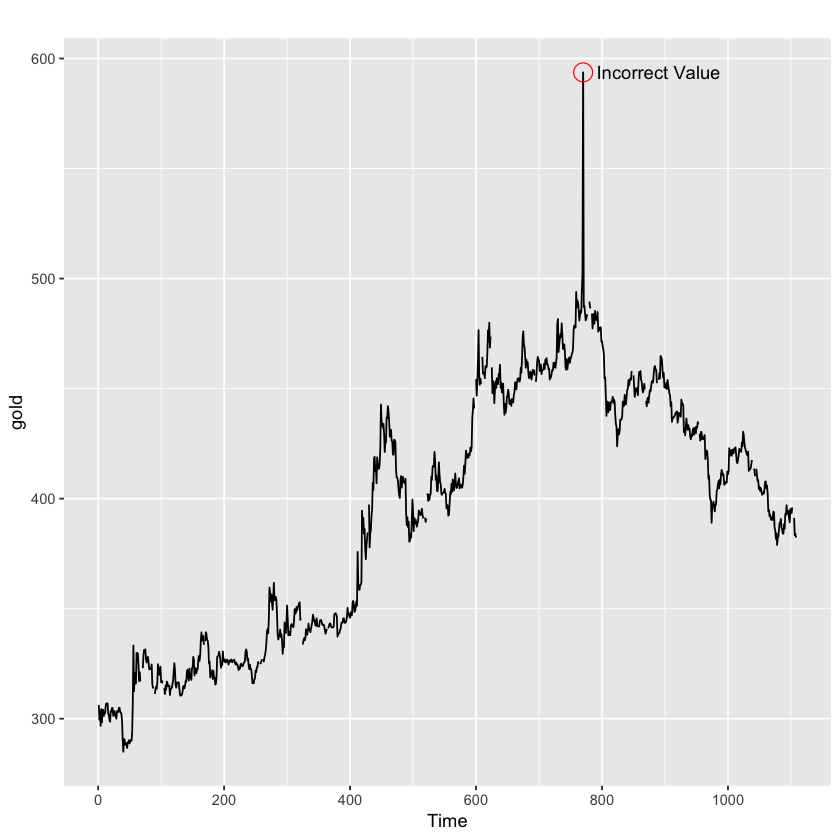

In [24]:
autoplot(gold) +
annotate(geom = "point", x = spike_date, y = gold[spike_date],
               size = 5, shape = 21, colour = "red", fill = "transparent") +
annotate(geom = "text", x = spike_date + 120, y = gold[spike_date], label = "Incorrect Value")

Create a second plot where the incorrect value has been removed.

In [25]:
gold_1 <- gold

In [26]:
spike_date_1 <- which.max(gold_1)

In [27]:
spike_date_1

[1] 770

In [28]:
gold_1[770] <- NA

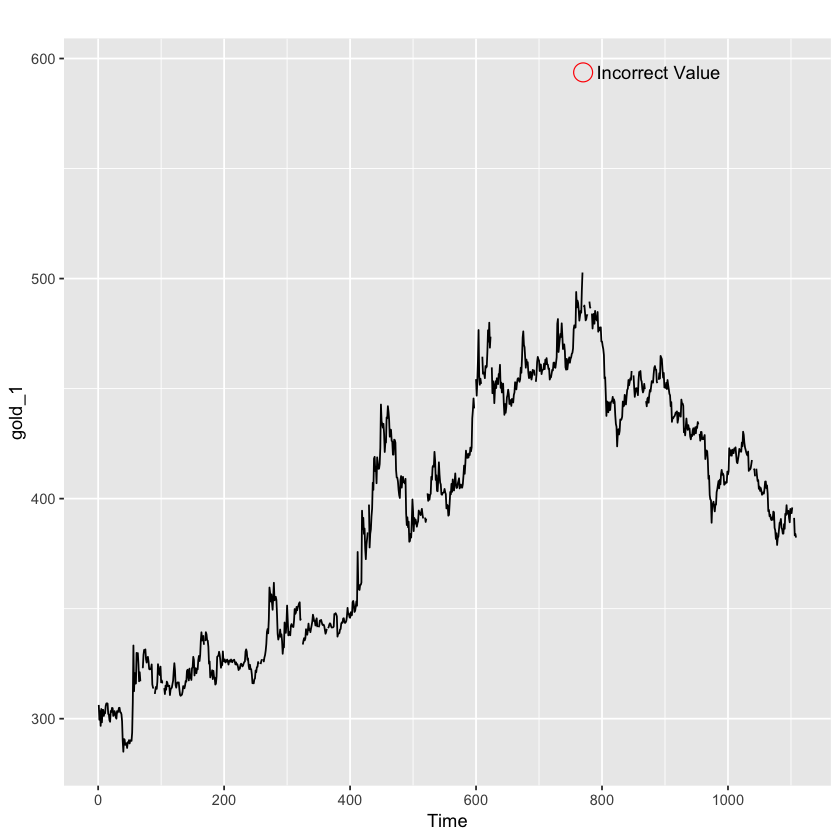

In [29]:
autoplot(gold_1) +
annotate(geom = "point", x = spike_date, y = gold[spike_date],
               size = 5, shape = 21, colour = "red", fill = "transparent") +
annotate(geom = "text", x = spike_date + 120, y = gold[spike_date], label = "Incorrect Value")

Read the documentation for the geom geom_hline. Use it to add a red reference line to the plot, at y = 400.

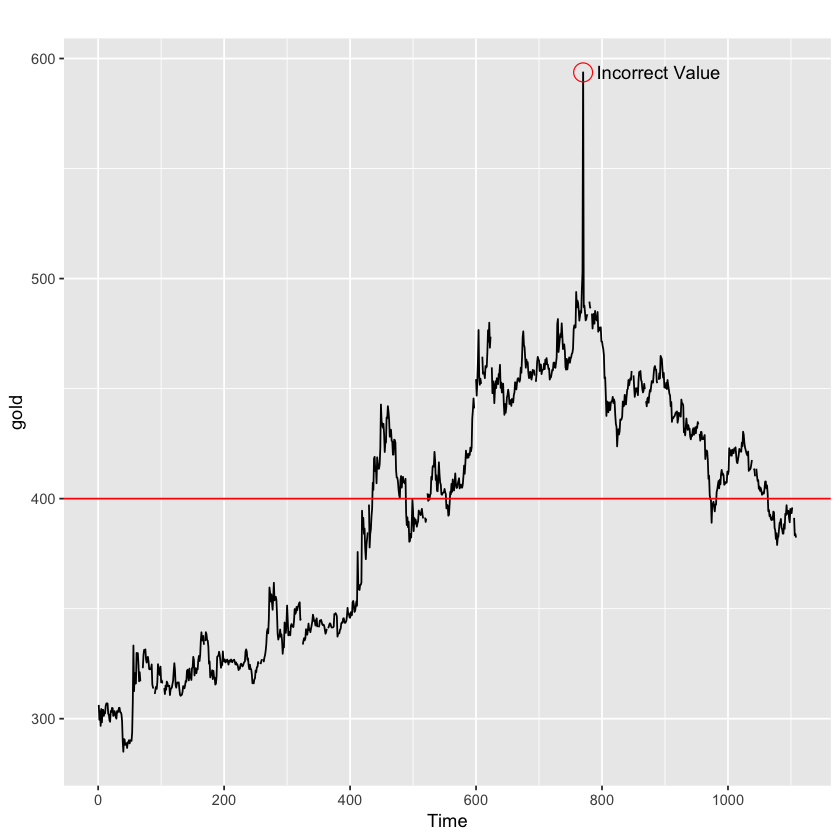

In [30]:
autoplot(gold) +
annotate(geom = "point", x = spike_date, y = gold[spike_date],
               size = 5, shape = 21, colour = "red", fill = "transparent") +
annotate(geom = "text", x = spike_date + 120, y = gold[spike_date], label = "Incorrect Value") +
geom_hline(colour = "red", yintercept = 400)

## Longitudinal data 

### Autoplot 

Multiple time series with identical time points, known as longitudinal data or panel data, commonly occur in applications. One example of this is given by the elecdaily time series, which contains information about electricity demand in Victoria, Australia during 2014. As with a single time series, we can plot these data using autoplot:

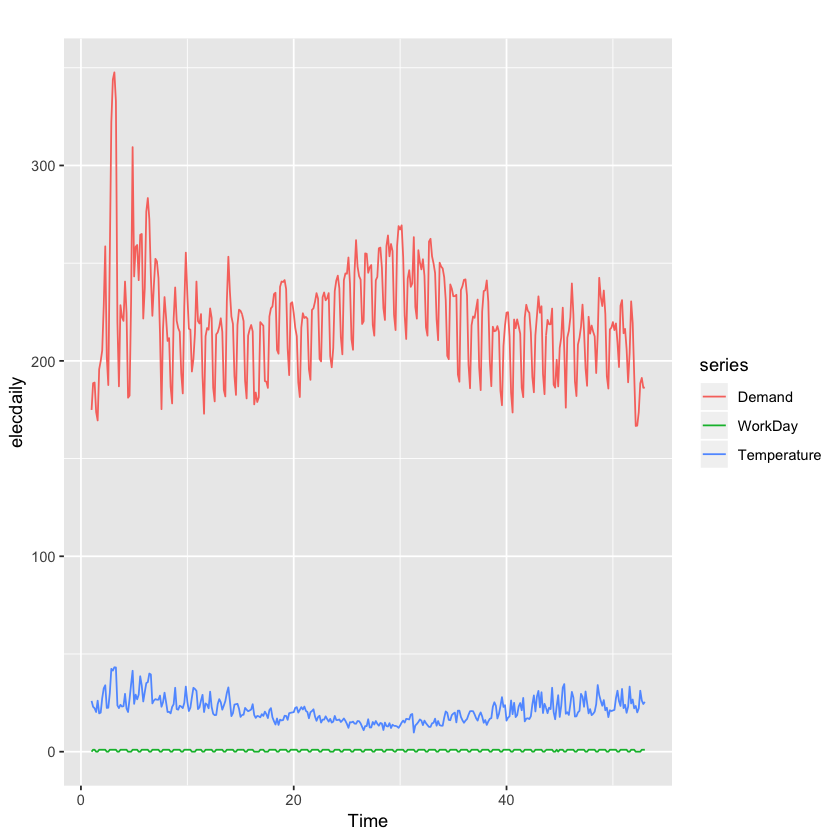

In [31]:
library(forecast); library(fpp2)
autoplot(elecdaily)

In this case, it is probably a good idea to facet the data, i.e. to plot each series in a separate figure:

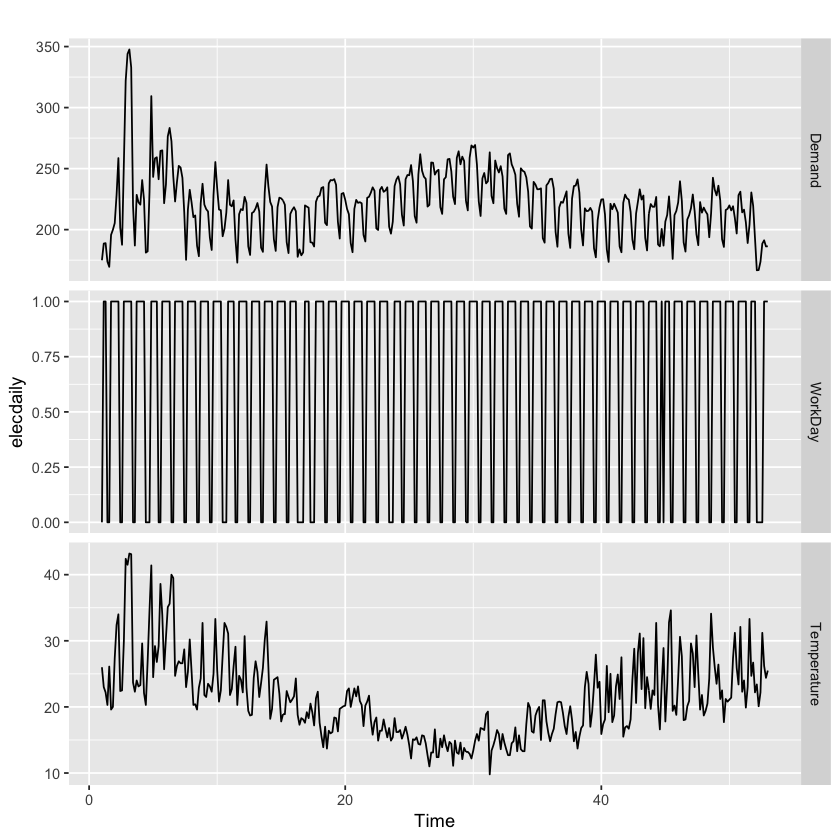

In [32]:
autoplot(elecdaily, facets = TRUE)

## Exercise 4 

Make the following changes to the plot you created above:

Remove the WorkDay variable from the plot (it describes whether or not a given date is a work day, and while it is useful for modelling purposes, we do not wish to include it in our figure).

In [101]:
?elecdaily

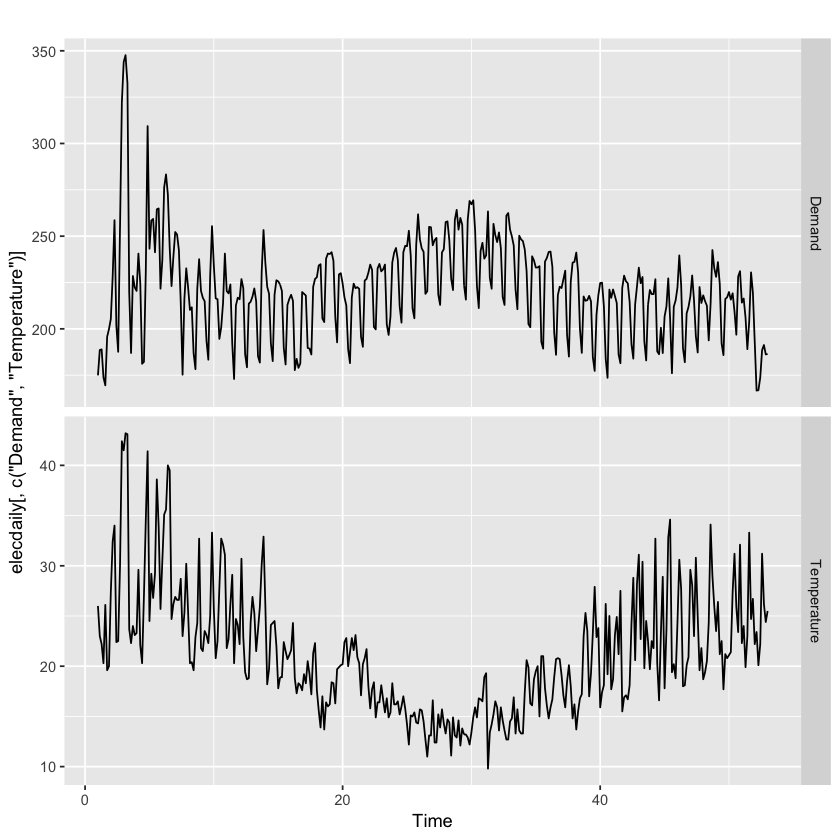

In [33]:
autoplot(elecdaily[, c("Demand", "Temperature")], facets = TRUE)

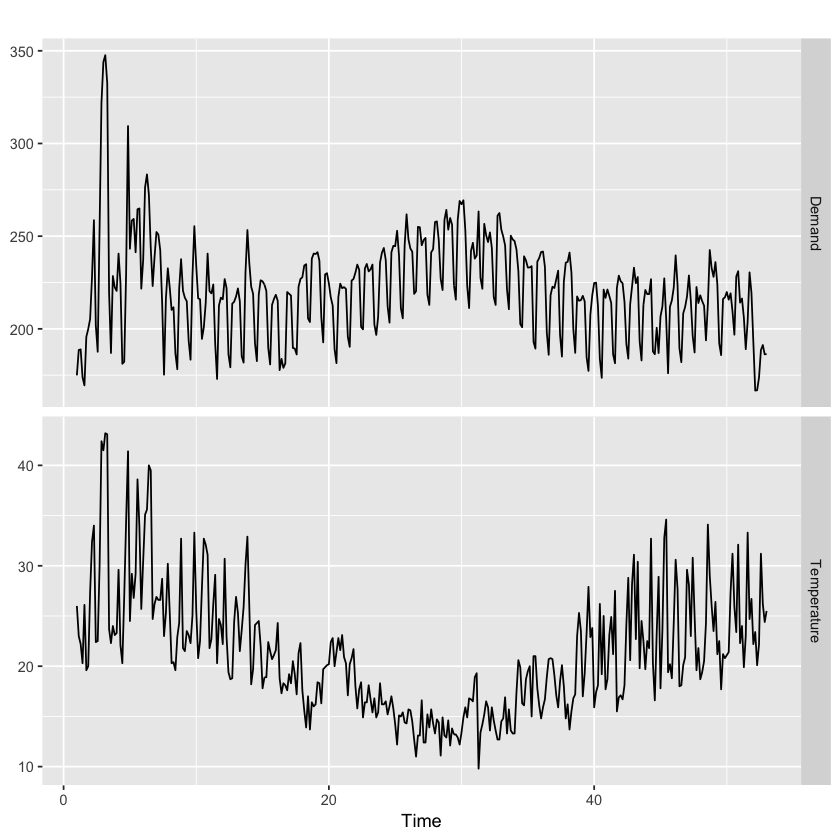

In [35]:
 autoplot(elecdaily[, c("Demand", "Temperature")], facets = TRUE) + ylab(NULL)

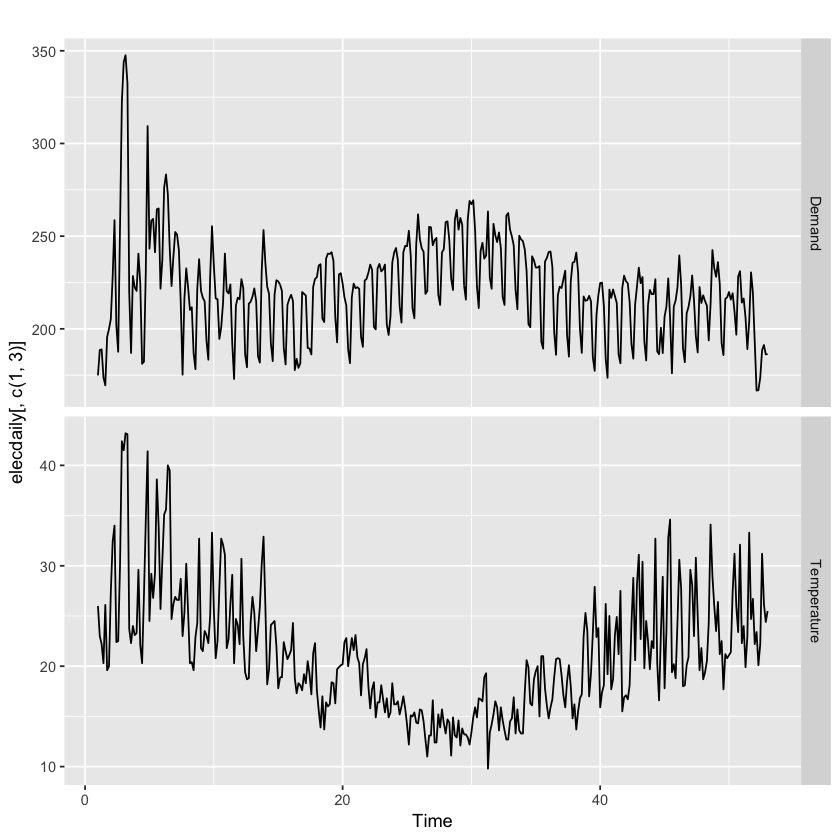

In [34]:
autoplot(elecdaily [, c(1,3)], facets = TRUE)

Add smoothed trend lines to the time series plots.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


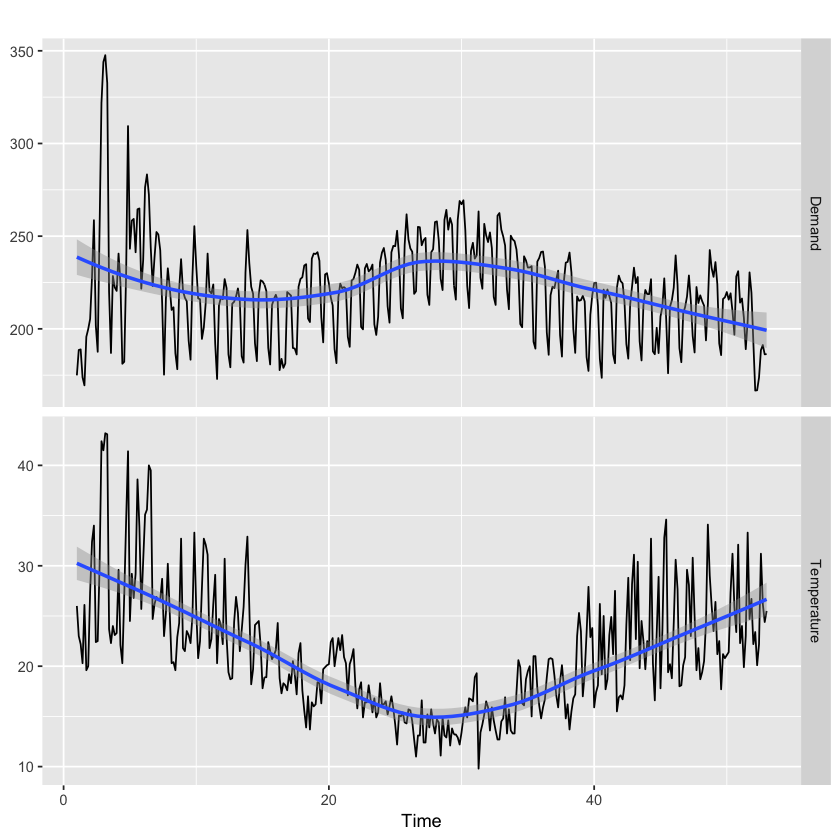

In [36]:
autoplot(elecdaily[, c("Demand", "Temperature")], facets = TRUE) + 
geom_smooth() +
ylab(NULL)

In [14]:
elecdaily

ERROR while rich displaying an object: Error in repr_matrix_generic(obj, "\n%s%s\n", sprintf("|%%s\n|%s|\n", : formal argument "cols" matched by multiple actual arguments

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = erro

,Demand,WorkDay,Temperature
1.000000,174.8963,0,26.0
1.142857,188.5909,1,23.0
1.285714,188.9169,1,22.2
1.428571,173.8142,0,20.3
1.571429,169.5152,0,26.1
1.714286,195.7288,1,19.6
1.857143,199.9029,1,20.0
2.000000,205.3375,1,27.4
2.142857,228.0782,1,32.4
2.285714,258.5984,1,34.0


You’ll notice that the x-axis shows week numbers with decimals, rather than dates (the dates in the elecdaily time series object are formatted as weeks with decimal numbers). Make a time series plot of the Demand variable with dates (2014-01-01 to 2014-12-31) along the x-axis (your solution is likely to rely on standard R techniques rather than autoplot).

Create a new data frame with the correct dates and the demand data:

In [37]:
dates <- seq.Date(as.Date("2014-01-01"), as.Date("2014-12-31"), by = "day")

In [38]:
elecdaily2 <- data.frame(dates = dates, demand = elecdaily[,1])

In [39]:
elecdaily2

dates,demand
2014-01-01,174.8963
2014-01-02,188.5909
2014-01-03,188.9169
2014-01-04,173.8142
2014-01-05,169.5152
2014-01-06,195.7288
2014-01-07,199.9029
2014-01-08,205.3375
2014-01-09,228.0782
2014-01-10,258.5984


Don't know how to automatically pick scale for object of type ts. Defaulting to continuous.


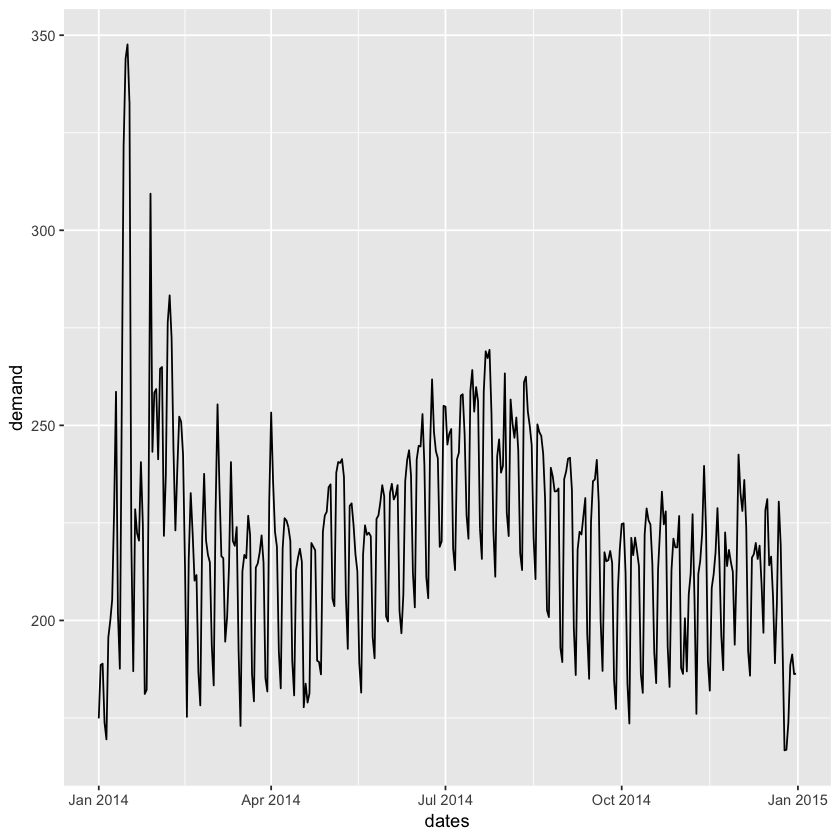

In [40]:
ggplot(elecdaily2, aes(dates, demand)) + 
geom_line()

A more elegant approach relies on the xts package for time series:

In [41]:
library(xts)

Loading required package: zoo

Attaching package: ‘zoo’

The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



Convert time series to an xts object:

In [42]:
dates <- seq.Date(as.Date("2014-01-01"), as.Date("2014-12-31"), by = "day") 
elecdaily3 <- xts(elecdaily, order.by = dates)

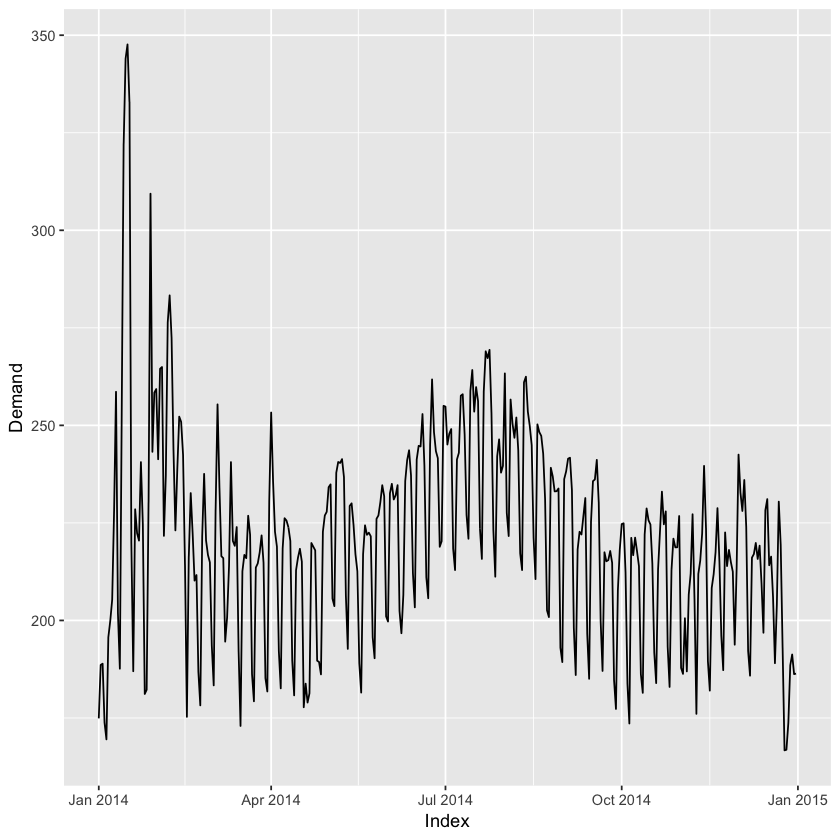

In [43]:
autoplot(elecdaily3[,"Demand"])

## Path plots 

Another option for plotting multiple time series is path plots. A path plot is a scatterplot where the points are connected with lines in the order that they appear in the data (which, for time series data, should correspond to time). The lines and points can be coloured to represent time.

To make a path plot of Temperature versus Demand for the elecdaily data, we first convert the time series object to a data frame and create a scatterplot:

In [44]:
library(fpp2)

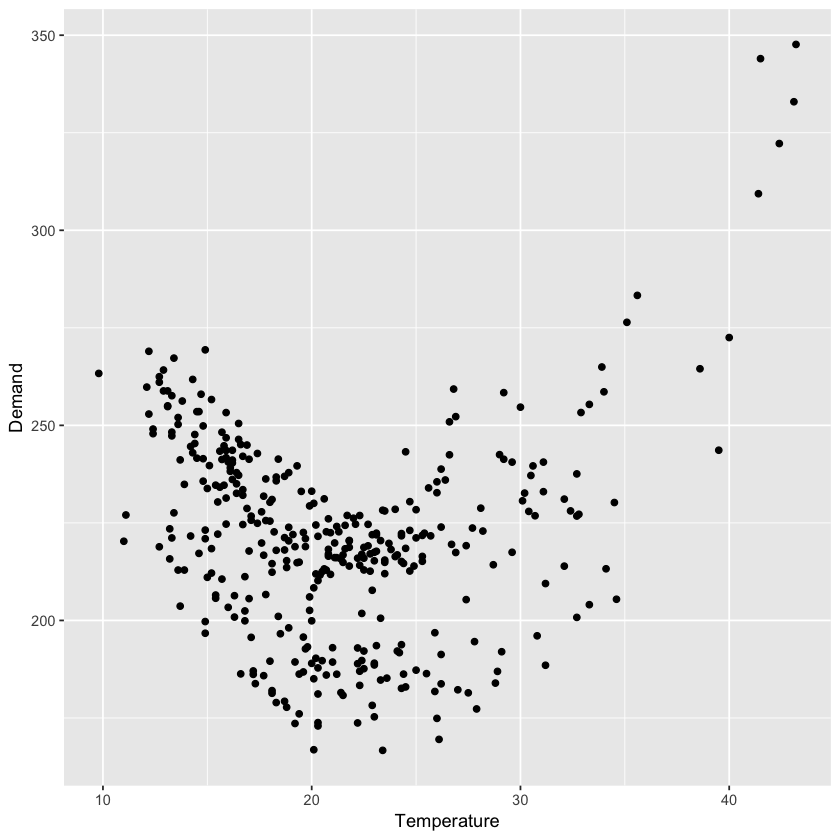

In [45]:
ggplot(as.data.frame(elecdaily), aes(Temperature, Demand)) +
geom_point()

Next, we connect the points by lines using the geom_path geom:

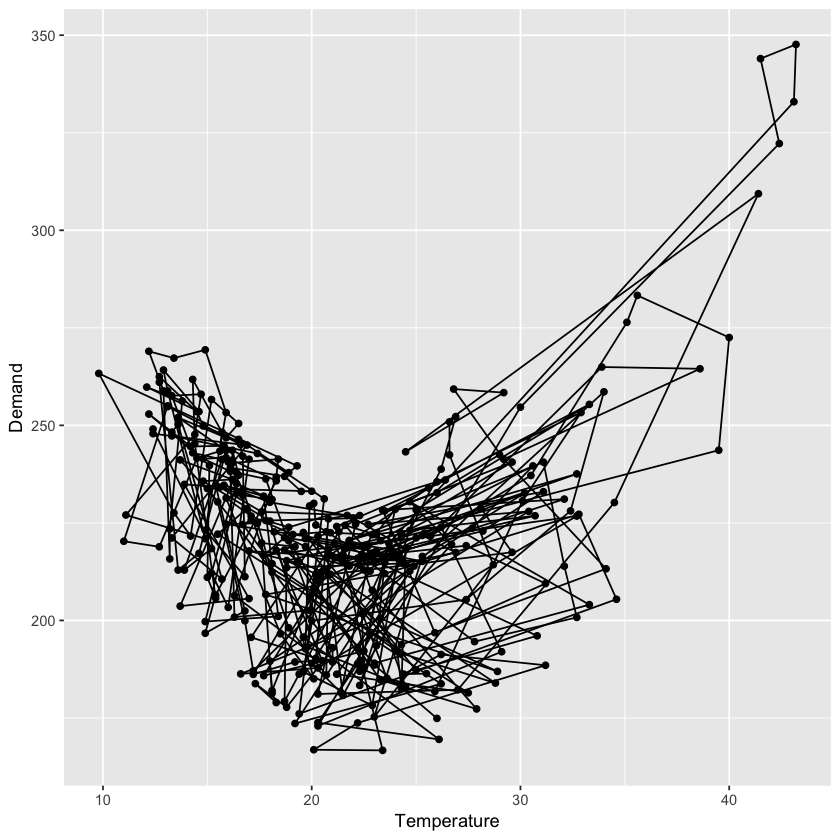

In [46]:
ggplot(as.data.frame(elecdaily), aes(Temperature, Demand)) + geom_point() +
geom_path()

The resulting figure is quite messy. Using colour to indicate the passing of time helps a little. For this, we need to add the dates to the data frame:

In [51]:
elecdaily2 <- as.data.frame(elecdaily)

In [48]:
elecdaily2

Demand,WorkDay,Temperature
174.8963,0,26.0
188.5909,1,23.0
188.9169,1,22.2
173.8142,0,20.3
169.5152,0,26.1
195.7288,1,19.6
199.9029,1,20.0
205.3375,1,27.4
228.0782,1,32.4
258.5984,1,34.0


In [52]:
elecdaily2$Date <- seq.Date(as.Date("2014-01-01"), as.Date("2014-12-31"), by = "day")

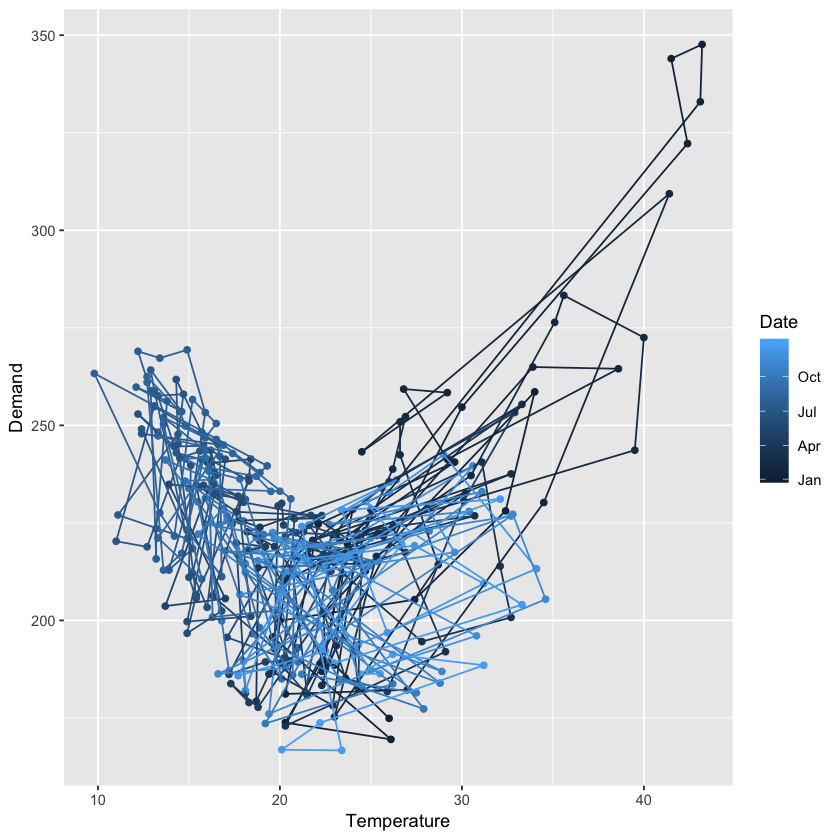

In [53]:
ggplot(elecdaily2, aes(Temperature, Demand, colour = Date)) + geom_point() +
geom_path()

In [13]:
elecdaily2

Demand,WorkDay,Temperature,Date
174.8963,0,26.0,2014-01-01
188.5909,1,23.0,2014-01-02
188.9169,1,22.2,2014-01-03
173.8142,0,20.3,2014-01-04
169.5152,0,26.1,2014-01-05
195.7288,1,19.6,2014-01-06
199.9029,1,20.0,2014-01-07
205.3375,1,27.4,2014-01-08
228.0782,1,32.4,2014-01-09
258.5984,1,34.0,2014-01-10


It becomes clear from the plot that temperatures were the highest at the beginning of the year, and lower in the winter months (July-August).

## Exercise 5 

Make the following changes to the plot you created above:

Decrease the size of the points.

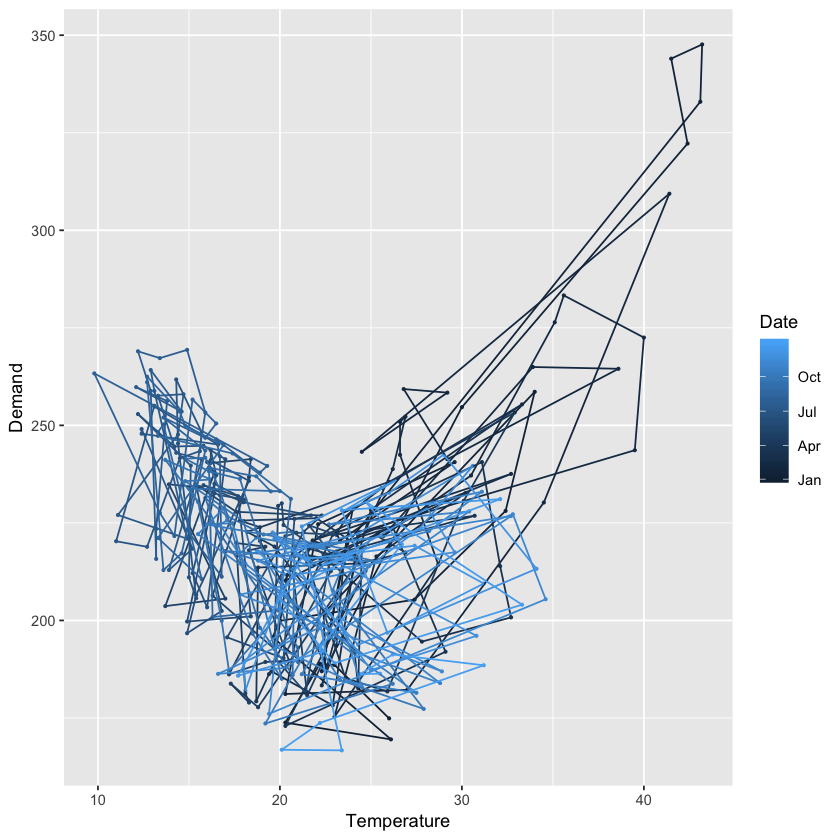

In [54]:
ggplot(elecdaily2, aes(Temperature, Demand, colour = Date)) + 
geom_point(size = 0.5) +
geom_path()

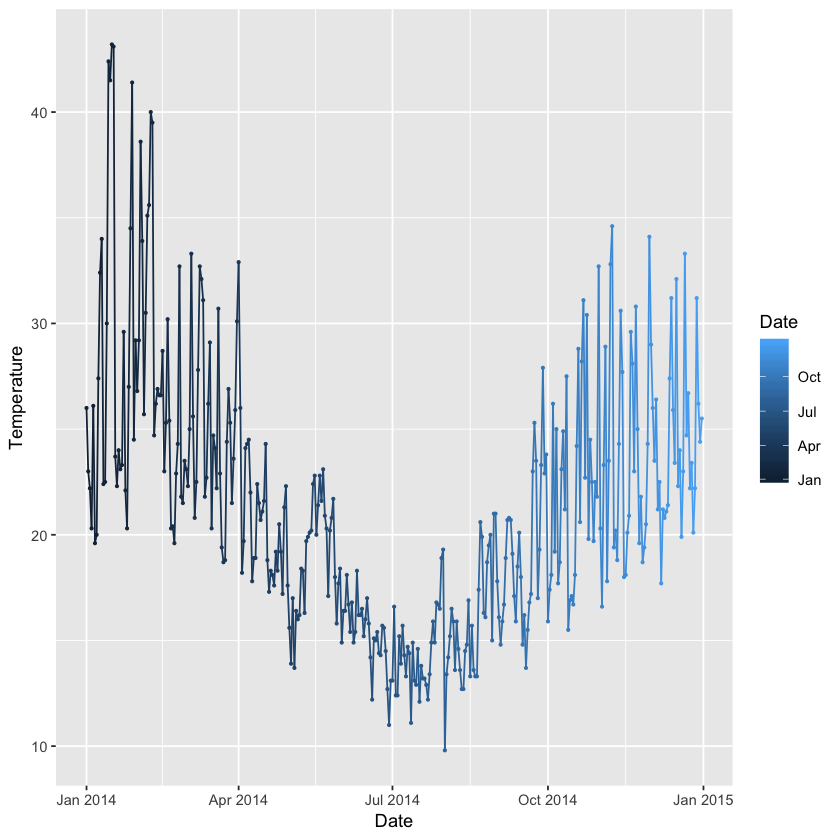

In [55]:
ggplot(elecdaily2, aes(Date, Temperature, colour = Date)) + 
geom_point(size = 0.5) +
geom_path()

Add text annotations showing the dates of the highest and lowest temperatures, by the corresponding points in the figure.

In [56]:
summary(elecdaily2)

     Demand         WorkDay        Temperature         Date           
 Min.   :166.7   Min.   :0.0000   Min.   : 9.80   Min.   :2014-01-01  
 1st Qu.:205.4   1st Qu.:0.0000   1st Qu.:16.60   1st Qu.:2014-04-02  
 Median :221.0   Median :1.0000   Median :20.30   Median :2014-07-02  
 Mean   :221.3   Mean   :0.6877   Mean   :21.26   Mean   :2014-07-02  
 3rd Qu.:236.7   3rd Qu.:1.0000   3rd Qu.:24.30   3rd Qu.:2014-10-01  
 Max.   :347.6   Max.   :1.0000   Max.   :43.20   Max.   :2014-12-31  

In [58]:
lowest <- which.min(elecdaily2$Temperature) # Lowest temperature

In [59]:
highest <- which.max(elecdaily2$Temperature) # Highest temperature

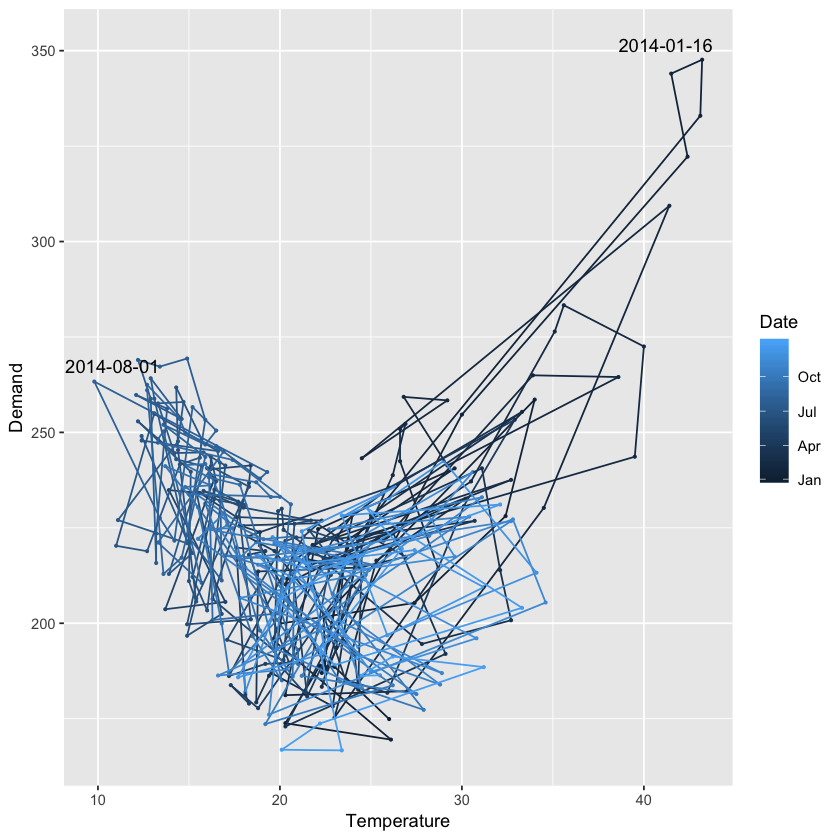

In [72]:
ggplot(elecdaily2, aes(Temperature, Demand, colour = Date)) + 
geom_point(size = 0.5) +
geom_path() +
annotate(geom = "text", x = elecdaily2$Temperature[lowest] + 1,
y = elecdaily2$Demand[lowest] + 4,
label = elecdaily2$Date[lowest]) +
annotate(geom = "text", x = elecdaily2$Temperature[highest] - 2,
y = elecdaily2$Demand[highest] + 4, label = elecdaily2$Date[highest])

## Spaghetti plots

In cases where we’ve observed multiple subjects over time, we often wish to visualise their individual time series together using so-called spaghetti plots. With ggplot2 this is done using the geom_line geom. To illustrate this, we use the Oxboys data, showing the height of 26 boys over time.

In [73]:
library(nlme)

In [46]:
Oxboys

Subject,age,height,Occasion
1,-1.0000,140.5,1
1,-0.7479,143.4,2
1,-0.4630,144.8,3
1,-0.1643,147.1,4
1,-0.0027,147.7,5
1,0.2466,150.2,6
1,0.5562,151.7,7
1,0.7781,153.3,8
1,0.9945,155.8,9
2,-1.0000,136.9,1


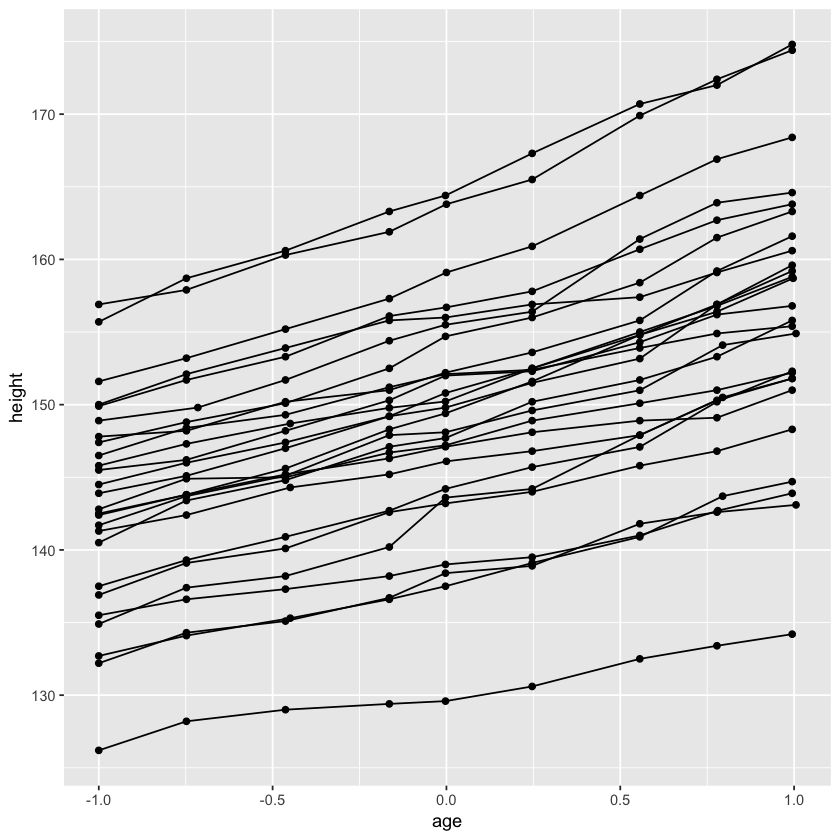

In [74]:
ggplot(Oxboys, aes(age, height, group = Subject)) +
geom_point() + geom_line()

The first two aes arguments specify the x and y-axes, and the third specifies that there should be one line per subject (i.e. per boy) rather than a single line interpolating all points. The latter would be a rather useless figure that looks like this:

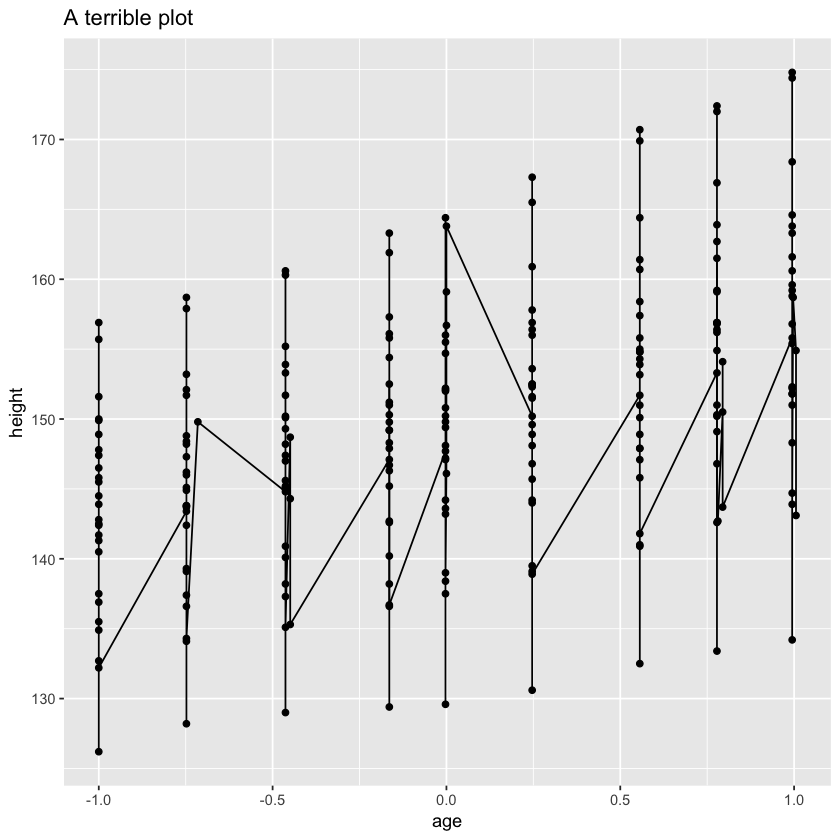

In [75]:
ggplot(Oxboys, aes(age, height)) + geom_point() +
geom_line() +
ggtitle("A terrible plot")

Returning to the original plot, if we wish to be able to identify which time series corresponds to which boy, we can add a colour aesthetic:

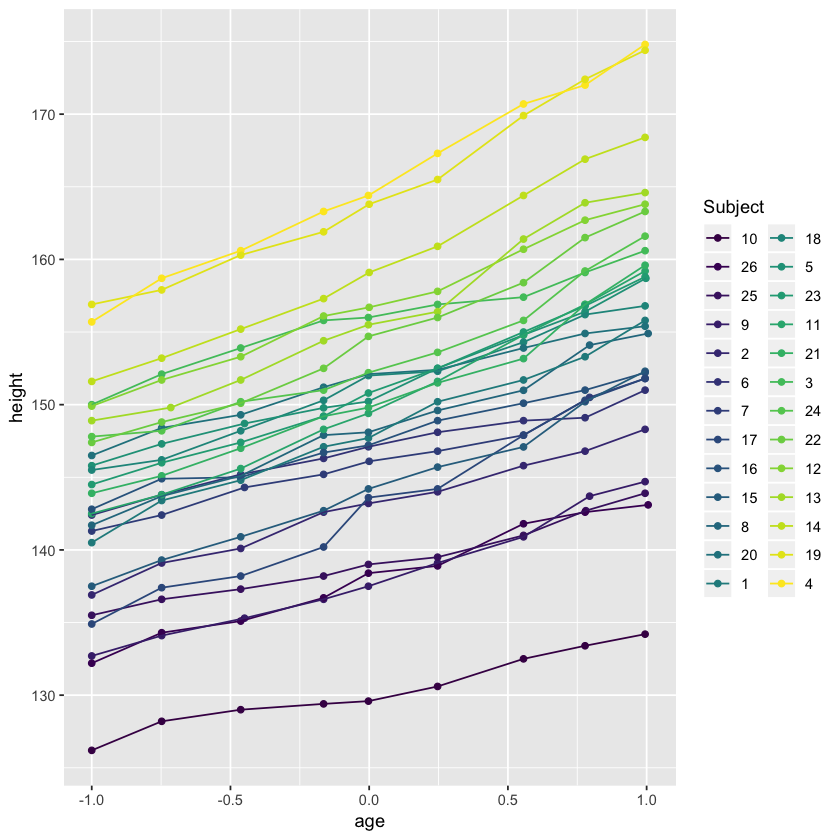

In [76]:
ggplot(Oxboys, aes(age, height, group = Subject, colour = Subject)) + 
geom_point() +
geom_line()

Note that the boys are ordered by height, rather than subject number, in the legend.

Now, imagine that we wish to add a trend line describing the general growth trend for all boys. The growth
appears approximately linear, so it seems sensible to use geom_smooth(method = "lm") to add the trend:

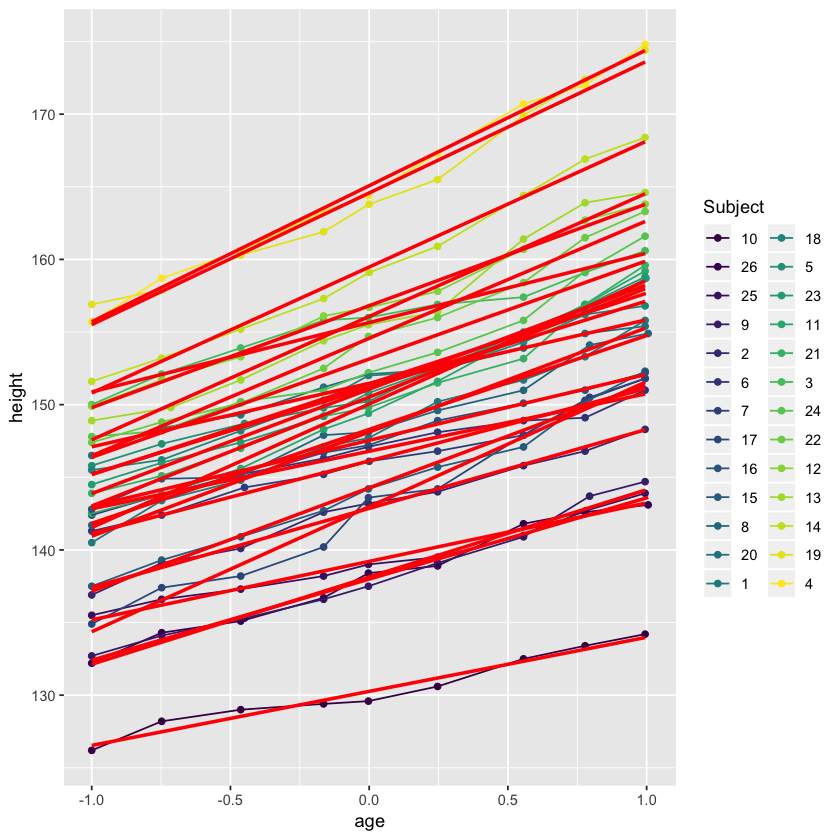

In [77]:
ggplot(Oxboys, aes(age, height, group = Subject, colour = Subject)) + 
geom_point() +
geom_line() +
geom_smooth(method = "lm", colour = "red", se = FALSE)

Unfortunately, because we have specified in the aestethics that the data should be grouped by Subject, geom_smooth produces one trend line for each boy. The “problem” is that when we specify an aesthetic in the ggplot call, it is used for all geoms.

## Exercise 6 

Figure out how to produce a spaghetti plot of the Oxboys data with a single red trend line based on the data from all 26 boys.

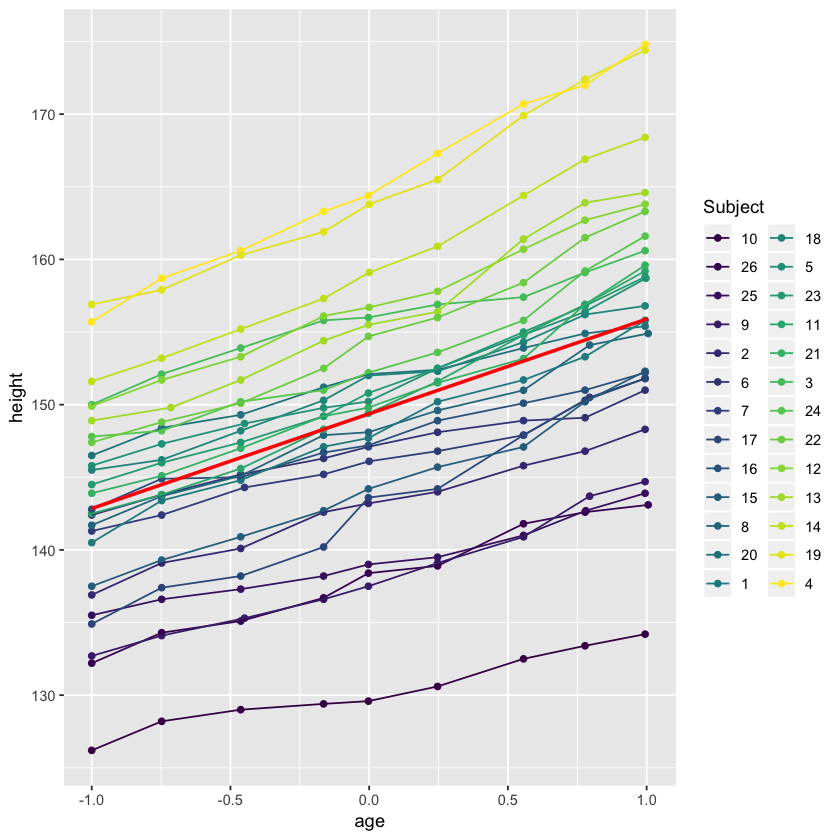

In [78]:
ggplot(Oxboys, aes(age, height, colour = Subject)) + geom_point() +
geom_line(aes(group = Subject)) +
geom_smooth(method = "lm", colour = "red", se = FALSE)

## Seasonal plots, decomposition and ACF 

The forecast packages includes a number of useful functions when working with time series. One of them is ggseasonplot, which allows us to easily create a spaghetti plot of different periods of a time series with seasonality, i.e. with patterns that repeat seasonally over time. It works similar to the autoplot function, in that it replaces the ggplot(data, aes) + geom part of the code.

In [79]:
library(forecast); library(fpp2)

In [94]:
a10

ERROR while rich displaying an object: Error in repr_matrix_generic(obj, "\n%s%s\n", sprintf("|%%s\n|%s|\n", : formal argument "cols" matched by multiple actual arguments

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = erro

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
1991,,,,,,,3.526591,3.180891,3.252221,3.611003,3.565869,4.306371
1992,5.088335,2.814520,2.985811,3.204780,3.127578,3.270523,3.737851,3.558776,3.777202,3.924490,4.386531,5.810549
1993,6.192068,3.450857,3.772307,3.734303,3.905399,4.049687,4.315566,4.562185,4.608662,4.667851,5.093841,7.179962
1994,6.731473,3.841278,4.394076,4.075341,4.540645,4.645615,4.752607,5.350605,5.204455,5.301651,5.773742,6.204593
1995,6.749484,4.216067,4.949349,4.823045,5.194754,5.170787,5.256742,5.855277,5.490729,6.115293,6.088473,7.416598
1996,8.329452,5.069796,5.262557,5.597126,6.110296,5.689161,6.486849,6.300569,6.467476,6.828629,6.649078,8.606937
1997,8.524471,5.277918,5.714303,6.214529,6.411929,6.667716,7.050831,6.704919,7.250988,7.819733,7.398101,10.096233
1998,8.798513,5.918261,6.534493,6.675736,7.064201,7.383381,7.813496,7.431892,8.275117,8.260441,8.596156,10.558939
1999,10.391416,6.421535,8.062619,7.297739,7.936916,8.165323,8.717420,9.070964,9.177113,9.251887,9.933136,11.532974
2000,12.511462,7.457199,8.591191,8.474000,9.386803,9.560399,10.834295,10.643751,9.908162,11.710041,11.340151,12.079132


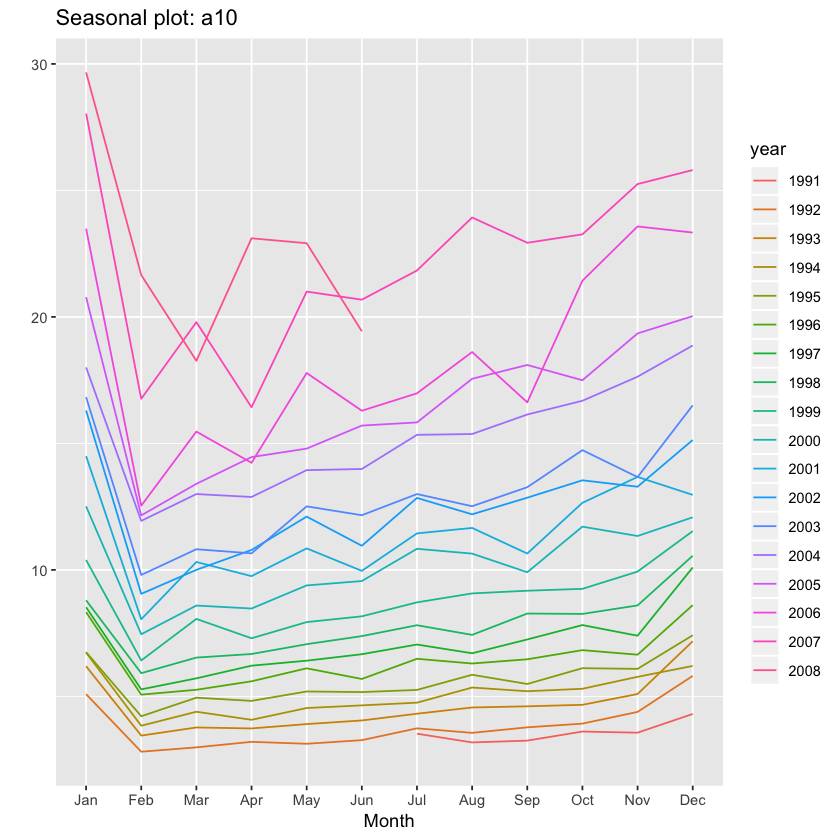

In [80]:
ggseasonplot(a10)

This function is very useful when visually inspecting seasonal patterns.

The year.labels and year.labels.left arguments removes the legend in favour of putting the years at the end and beginning of the lines:

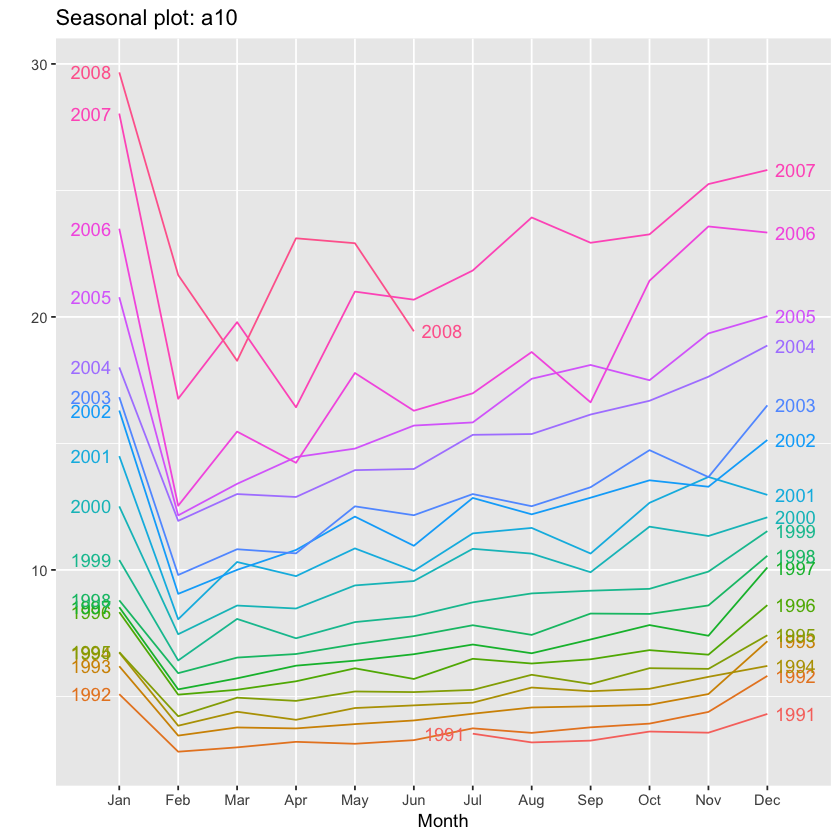

In [81]:
ggseasonplot(a10, year.labels = TRUE, year.labels.left = TRUE)

As always, we can add more things to our plot if we like:

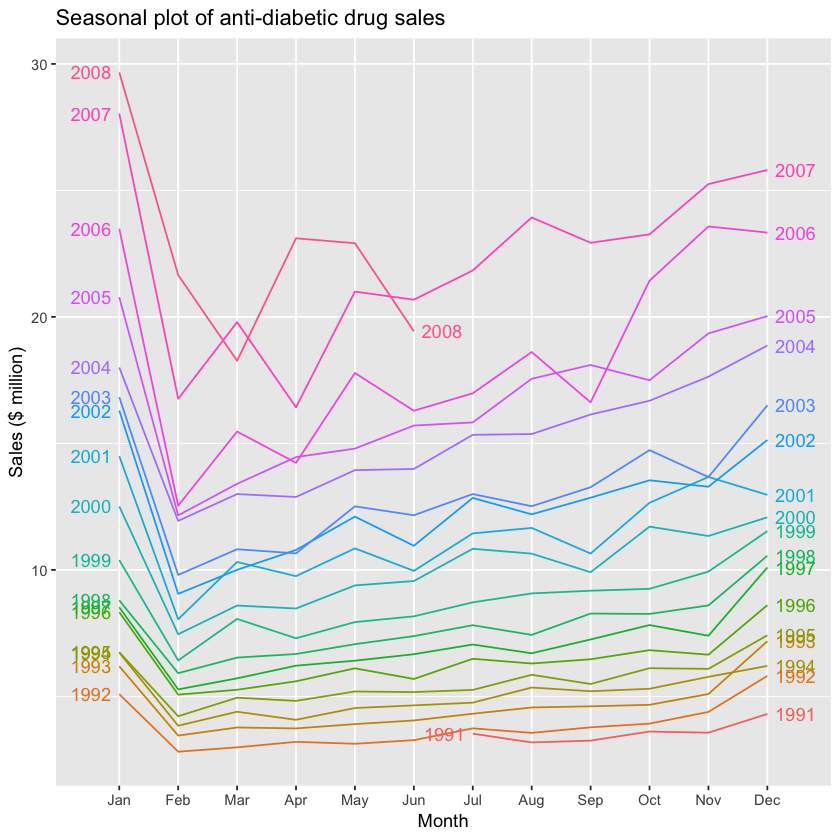

In [82]:
ggseasonplot(a10, year.labels = TRUE, year.labels.left = TRUE) + 
ylab("Sales ($ million)") +
ggtitle("Seasonal plot of anti-diabetic drug sales")

When working with seasonal time series, it is common to decompose the series into a seasonal component, a trend component and a remainder. In R, this is typically done using the stl function, which uses repeated LOESS smoothing to decompose the series. There is an autoplot function for stl objects:

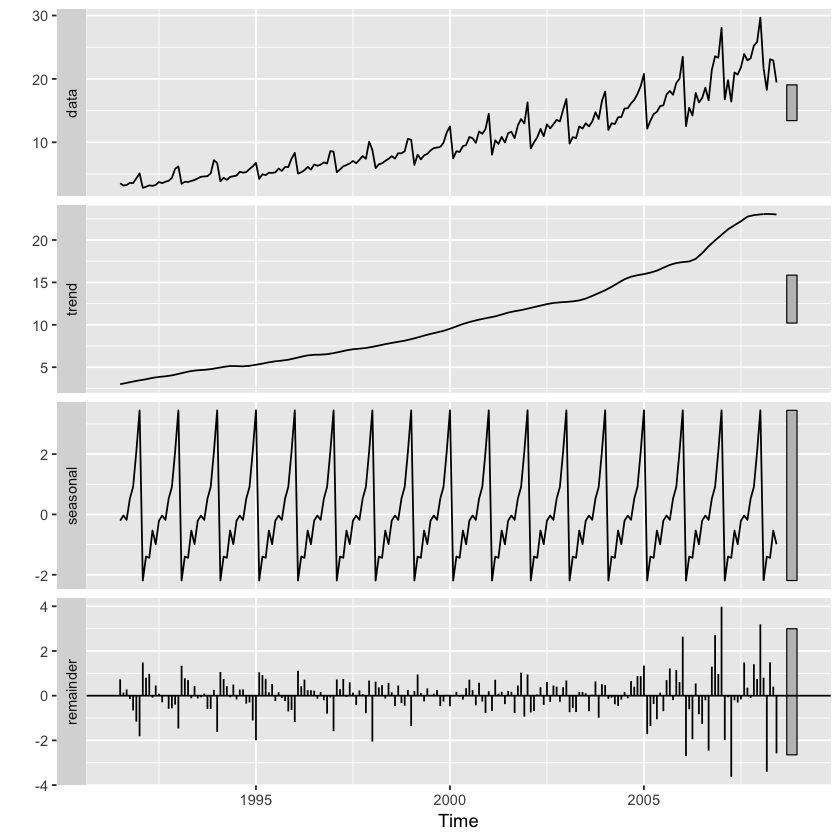

In [83]:
autoplot(stl(a10, s.window = 365))

Similarly, there is an autoplot function for auto-correlation functions (ACF) of time series:

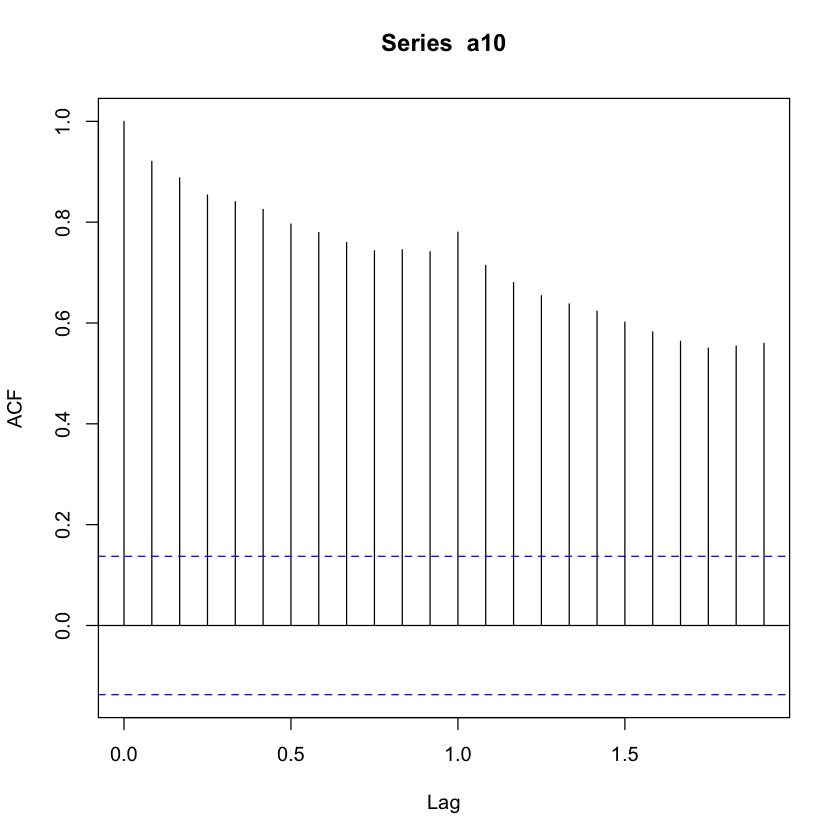

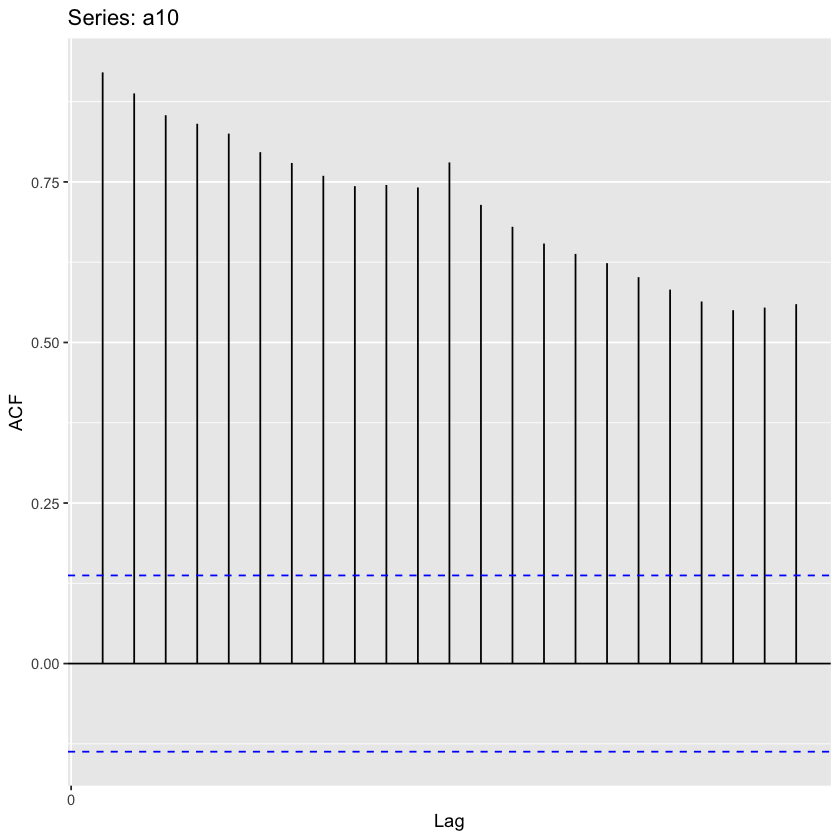

In [84]:
autoplot(acf(a10))

These can be manipulated in the same way as other ggplot objects.

## Exercise 7 

Investigate the writing dataset graphically. Make a time series plot with a smoothed trend line, a seasonal plot and a stl-decomposition plot. Add appropriate plot titles and labels to the axes.

Time series plot

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


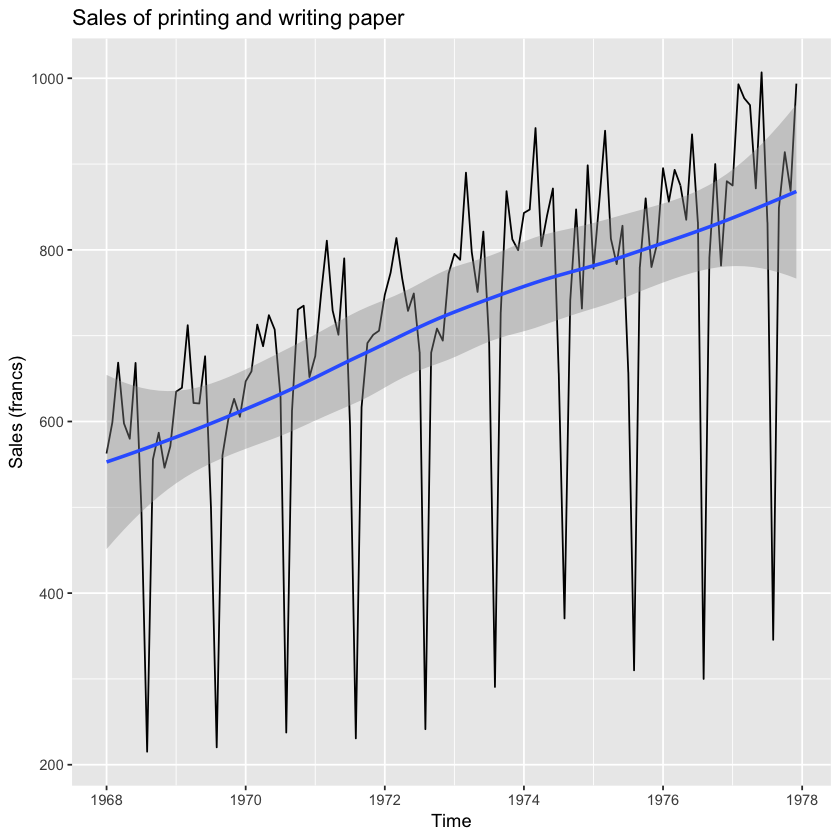

In [85]:
autoplot(writing) + 
geom_smooth() +
ylab("Sales (francs)") +
ggtitle("Sales of printing and writing paper")

Seasonal plot

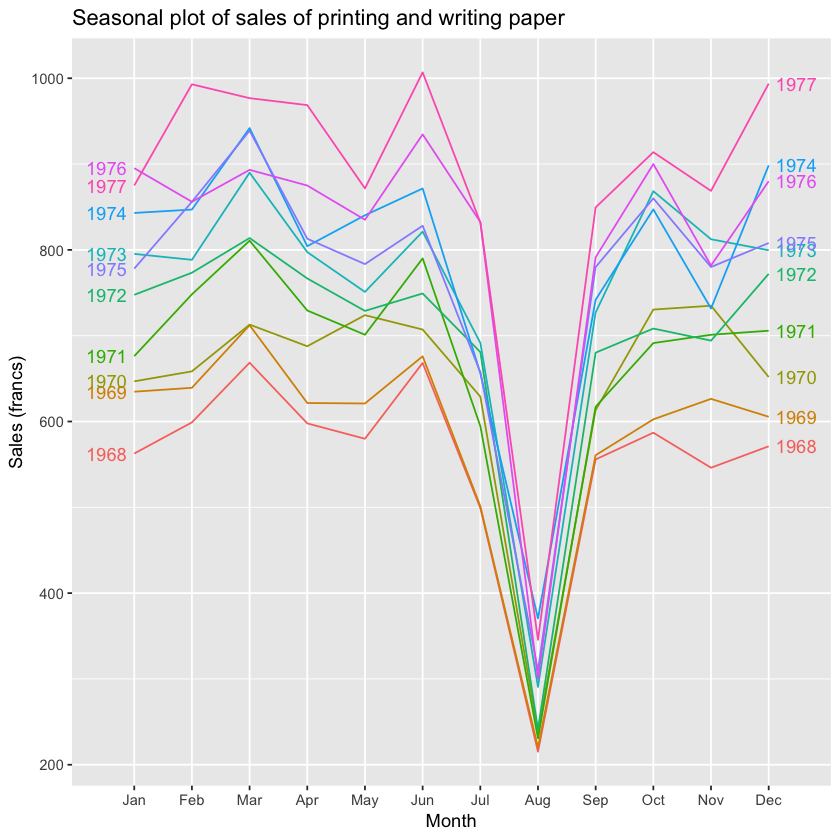

In [86]:
ggseasonplot(writing, year.labels = TRUE, year.labels.left = TRUE) + 
ylab("Sales (francs)") +
ggtitle("Seasonal plot of sales of printing and writing paper")

There is a huge dip in sales in August, when many French offices are closed # due to holidays.

stl-decomposition

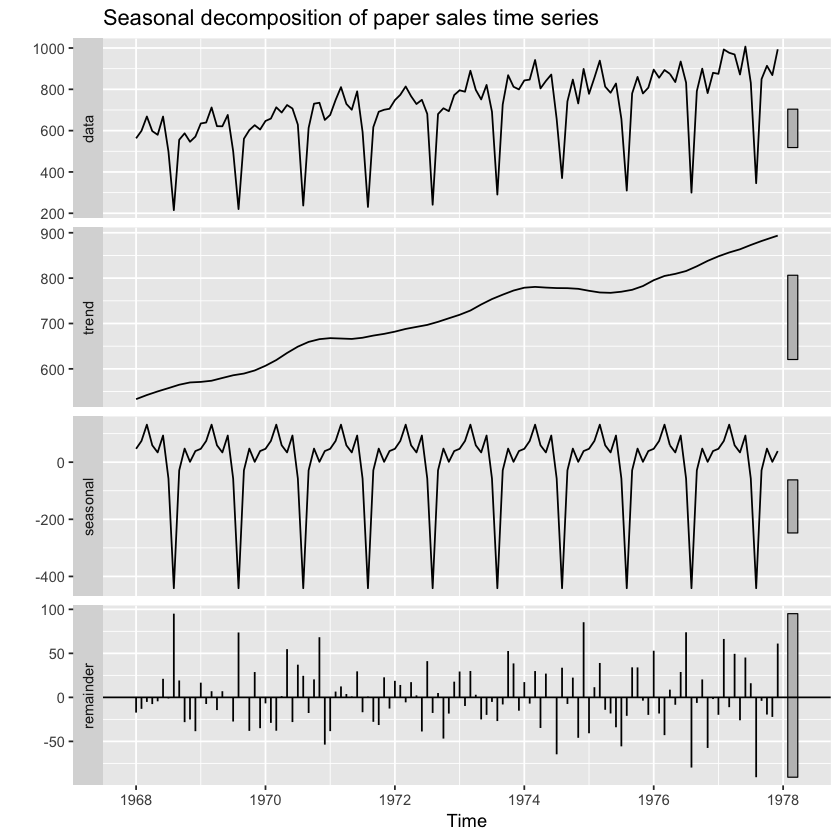

In [87]:
autoplot(stl(writing, s.window = 365)) +
ggtitle("Seasonal decomposition of paper sales time series")

## Interactive time series plots 

The plotly packages can be used to create interactive time series plots. When working with plotly, you create a ggplot2 object as usual, assigning it to a variable and then call the ggplotly function. Here is an example with the elecdaily data:

In [88]:
library(forecast) 
library(fpp2) 
library(plotly)

In [89]:
myPlot <- autoplot(elecdaily[,"Demand"])

In [90]:
ggplotly(myPlot)

HTML widgets cannot be represented in plain text (need html)

When you hover the mouse pointer over a point, a box appears, which displays information about that data point. Unfortunately, the date formatting isn’t great in this example - dates are shown as weeks with decimal points. We fix this in the same way as before, i.e. by creating a new data frame with nicely formatted dates:

First, create a data frame with better formatted dates

In [91]:
elecdaily2 <- as.data.frame(elecdaily)
elecdaily2$Date <- seq.Date(as.Date("2014-01-01"), as.Date("2014-12-31"), by = "day")

In [92]:
# Create the plot object
myPlot <- ggplot(elecdaily2, aes(Date, Demand)) + 
geom_line()

In [93]:
ggplotly(myPlot)

HTML widgets cannot be represented in plain text (need html)